In [1]:
suppressPackageStartupMessages({
    source('../libs.R')
    source('../utils.R')    
    source('../utils_mapping.R')    
})


# Make object

Combine labeled fibroblast objects

In [3]:
data_tissues <- list(
    sg = readRDS('/data/srlab2/ik936/Roche/data/cache/salivarygland_fibroblasts_obj.rds'),
    gut = readRDS('/data/srlab2/ik936/Roche/data/cache/fibroblast_object_gut.rds'),
    lung = readRDS('/data/srlab2/ik936/Roche/data/cache/lung_fibroblasts_obj.rds'),
    syn = readRDS('/data/srlab2/ik936/Roche/data/cache/synovium_fibroblasts_obj.rds')
)


In [ ]:
meta_data <- data_tissues %>% 
    map('meta_data') %>% 
    map(
        dplyr::select, 
        CellID, LibraryID, nGene, nUMI, percent_mito, 
        SampleID, Technology, Tissue, DonorID, 
        Case, Diagnosis, lineage, tissue_cluster = tissue_cell_type,
        matches('scDblFinder')
    ) %>% 
    dplyr::bind_rows() %>% 
    identity()


In [9]:
exprs_raw <- map(data_tissues, 'exprs_raw') %>% purrr::reduce(Matrix::cbind2)


Subset to only fibroblasts and QC 

In [13]:
meta_data <- meta_data %>% 
    subset(lineage %in% c('fibroblast')) %>% 
    subset(!tissue_cluster %in% c('UNKNOWN', 'LOWQC', 'DOUBLET')) 
exprs_raw <- exprs_raw[, meta_data$CellID]

In [14]:
nrow(meta_data)
head(meta_data)

[1] 79968

CellID,LibraryID,nGene,nUMI,percent_mito,SampleID,Technology,Tissue,DonorID,Case,Diagnosis,lineage,tissue_cluster,scDblFinder.weighted,scDblFinder.ratio,scDblFinder.score,scDblFinder.class
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>
AAACGCTCAGTTGTCA_GX44,GX44,2335,6313,0.08965626,GX44,10XV3,SalivaryGland,GX44,SICCA,NA,fibroblast,CD34,0.10872971,0.10,0.10872971,singlet
AAACGCTTCCTTATAC_GX44,GX44,3113,11020,0.09301270,GX44,10XV3,SalivaryGland,GX44,SICCA,NA,fibroblast,CCL19,0.09492730,0.10,0.09492730,singlet
AAAGGATTCTGCATGA_GX44,GX44,2367,5787,0.14014170,GX44,10XV3,SalivaryGland,GX44,SICCA,NA,fibroblast,CD34,0.03550406,0.05,0.03550406,singlet
AAAGGATTCTTTCCAA_GX44,GX44,1992,5306,0.17433095,GX44,10XV3,SalivaryGland,GX44,SICCA,NA,fibroblast,CD34,0.00000000,0.00,0.00000000,singlet
AAAGGGCAGAGTGTTA_GX44,GX44,2417,7568,0.07478858,GX44,10XV3,SalivaryGland,GX44,SICCA,NA,fibroblast,CD34,0.00000000,0.00,0.00000000,singlet
AAAGGGCCATTGAGCT_GX44,GX44,1958,3356,0.09266985,GX44,10XV3,SalivaryGland,GX44,SICCA,NA,fibroblast,CD34,0.00000000,0.00,0.00000000,singlet


In [16]:
## Save within-tissue analysis UMAP coordinates
UMAP_tissue <- data_tissues %>% map('umap_after') %>% reduce(rbind)
rownames(UMAP_tissue) <- data_tissues %>% map('meta_data') %>% map('CellID') %>% reduce(c)
UMAP_tissue <- UMAP_tissue[meta_data$CellID, ]
colnames(UMAP_tissue) <- c('UMAP1_tissue', 'UMAP2_tissue')
meta_data <- meta_data %>% cbind(UMAP_tissue)

## Weights

Strategy 1: logarithmic weighting. 

In [ ]:
# y <- factor(meta_data$Tissue)

# ## In this weighting scheme, Synovium should have 4.6x as much weight as lung
# ## This assumes that power to detect clusters increases logarithmically, not linearly 
# goal <- prop.table(log(table(y)) - min(log(table(y))) + 1)
# goal[['Synovium']] / goal[['Lung']]


# w <- as.numeric(goal / prop.table(table(y)))[y]

# ## Sanity checks
# message('weights sum to N')
# split(w, y) %>% map_dbl(sum) %>% sum

# message('weights achieve goal partition')
# split(w, y) %>% map_dbl(sum) %>% prop.table %>% round(3)


Strategy 1: equal weighting. 

In [19]:
y <- factor(meta_data$Tissue)
w <- as.numeric((1 / prop.table(table(y)))[y]) / nlevels(y)

# # (Optional) weigh by disease category
# weights2 <- split(seq_len(length(y1)), y1) %>% lapply(function(idx) {
#     y2 <- factor(meta_data$Case[idx])
#     w2 <- as.numeric((1 / prop.table(table(y2)))[y2]) / nlevels(y2)
#     w2 <- w2 * (sum(weights1[idx]) / sum(w2))
#     names(w2) <- meta_data$CellID[idx]
#     return(w2)
# }) %>%
#     purrr::reduce(c)

# weights2 <- data.frame(weight = weights2) %>% 
#     tibble::rownames_to_column('CellID')

In [20]:
if ('weight' %in% colnames(meta_data)) {
    meta_data$weight <- NULL    
}

# meta_data <- meta_data %>% dplyr::inner_join(weights2, by = 'CellID')
meta_data$weight <- w
# meta_data <- meta_data %>% dplyr::inner_join(weights1, by = 'CellID')


### Unit test: weights

In [21]:
!'weights' %in% colnames(meta_data)
'weight' %in% colnames(meta_data)
message('balanced tissues?')
max(abs(diff(data.table(meta_data)[, sum(weight), by = .(Tissue)]$V1))) < 1e-6
message('balanced cases?')
max(abs(data.table(meta_data)[, diff(.SD[, sum(weight), by = Case]$V1), by = .(Tissue)]$V1)) < 1e-6


[1] TRUE

[1] TRUE

balanced tissues?



[1] TRUE

balanced cases?



[1] FALSE

## Inflammatory gene selection

In [104]:
options(future.globals.maxSize = 1e9)
iag_df <- data_tissues %>% map(function(obj) {
    message(unique(obj$meta_data$Tissue))
    
    ## Collapse Counts
    pb <- presto::collapse_counts(
        obj$exprs_raw,
        obj$meta_data,
        c('LibraryID'),
        keep_n=TRUE, 
        how='sum'
    ) 
    pb$meta_data$logUMI <- log(colSums(pb$counts_mat))
    inflam_scores_df <- readRDS('/data/srlab2/ik936/Roche/data/cache/inflam_scores_icdf.rds')
    pb$meta_data <- pb$meta_data %>% 
        dplyr::left_join(inflam_scores_df) %>% 
        identity()


    ## 3 counts in at least 3 donors
    genes_test <- rownames(pb$counts_mat)[which(rowSums(pb$counts_mat >= 3) >= 3)]
    length(genes_test)


    ## Fit Models
    suppressWarnings({
        presto_obj <- presto.presto(
            formula = y~1+InflamScore_beta+(1|LibraryID)+offset(logUMI), 
            design = pb$meta_data, 
            response = pb$counts_mat, 
            size_varname = 'logUMI',
            features = genes_test,
            ncore = 22,
            nsim = 1e3,
            effects_cov = c('InflamScore_beta'),
            min_sigma = .5 * log(2),
            verbose = 0
        ) 
    })

    tibble(
        feature = colnames(presto_obj$beta),
        Tissue = unique(obj$meta_data$Tissue),
        beta = presto_obj$beta[which(presto_obj$betanames_df$grpvar == 'InflamScore_beta'), ],
        sigma = sqrt(presto_obj$covmat[2, 2, ]),
        zscore = beta / sigma,
        pvalue = 2 * exp(pnorm(abs(zscore), log.p = TRUE, lower.tail = FALSE))
    )
}) %>% 
    bind_rows()


SalivaryGland

Joining, by = "LibraryID"

CAUTION: if using GLMM, make sure your counts are integers!

Joining, by = "grpvar_orig"

Gut

Joining, by = "LibraryID"

CAUTION: if using GLMM, make sure your counts are integers!

Joining, by = "grpvar_orig"

Lung

Joining, by = "LibraryID"

CAUTION: if using GLMM, make sure your counts are integers!

Joining, by = "grpvar_orig"

Synovium

Joining, by = "LibraryID"

CAUTION: if using GLMM, make sure your counts are integers!

Joining, by = "grpvar_orig"



In [105]:
iag_df %>% 
#     subset(pvalue < 0.05 & abs(beta) > 0.1 * log(2)) %>% 
    subset(abs(zscore) > 1) %>% 
    with(table(Tissue, sign(beta)))


               
Tissue            -1    1
  Gut           4780 2259
  Lung          2005 1925
  SalivaryGland  990 5144
  Synovium      2371 5467

In [106]:
genes_iag <- unique(data.table(iag_df)[pvalue < 0.05 & abs(beta) > 0.1 * log(2), feature])
length(genes_iag)


[1] 6476

In [107]:
saveRDS(iag_df, '/data/srlab2/ik936/Roche/data/cache/iag_df.rds')


## Tissue cluster gene selection

In [7]:
genes_cag <- data_tissues %>% map(function(obj) {
    message(unique(obj$meta_data$Tissue))
    contrasts_mat <- make_contrast.presto(obj$presto, 'Cluster')
    effects <- contrasts.presto(obj$presto, contrasts_mat, one_tailed = FALSE) %>% 
        dplyr::mutate(Cluster = contrast) %>% 
        arrange(pvalue)
    data.table(effects)[pvalue < .01 & abs(beta) > 0.5 * log(2), feature]
}) %>% 
    purrr::reduce(union)


SalivaryGland

Gut

Lung

Synovium



## PCA

In [10]:
iag_df <- readRDS('/data/srlab2/ik936/Roche/data/cache/iag_df.rds')
genes_iag <- unique(data.table(iag_df)[pvalue < 0.05 & abs(beta) > 0.1 * log(2), feature])
length(genes_iag)
length(genes_cag)


## between the two, lots of potentially informative genes! 
length(union(genes_iag, genes_cag))


[1] 6476

[1] 7123

[1] 9521

In [27]:
set.seed(1)
obj <- create_object(
    exprs_raw, 
    meta_data, 
    npcs=50, 
#     split_vargenes_by='Tissue', ## unsupervised feature selection
#     var_genes=genes_iag, ## supervised feature selection
    var_genes=union(genes_iag, genes_cag),
    verbose=TRUE
)


start filter

start normalization



   user  system elapsed 
 16.443   7.744  24.421 


Finished normalization

start pca



    user   system  elapsed 
1818.865  357.015  384.170 


Finished PCA



PCA - do tissues take up similar amounts of space? 

Warning message:
“Ignoring unknown parameters: segment.size”
Warning message:
“Ignoring unknown parameters: label.size, segment.size”


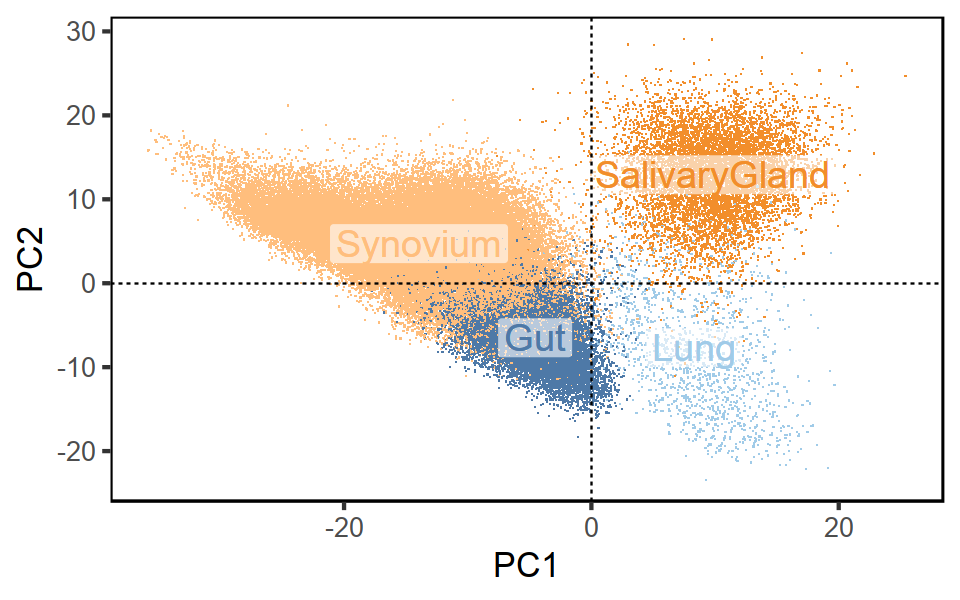

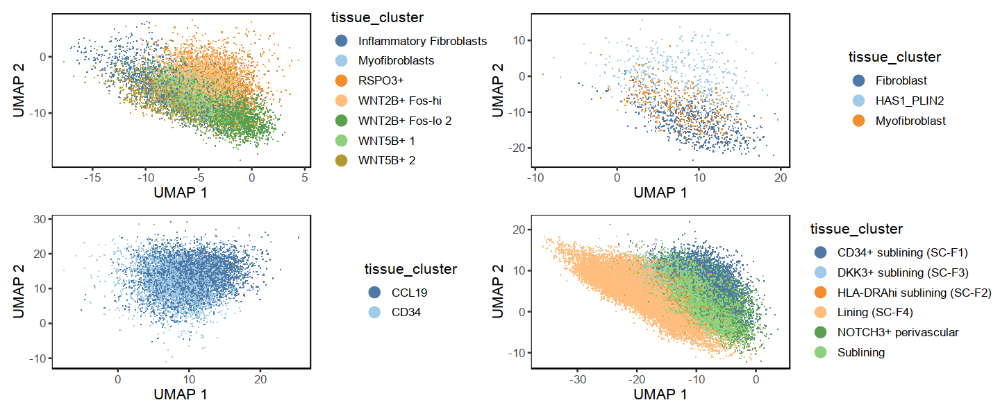

In [32]:
fig.size(5, 8)
obj$V %>% 
    data.frame() %>% 
    dplyr::rename(X1 = PC1, X2 = PC2) %>% 
    do_scatter(obj$meta_data, 'Tissue', pt_size = 8, base_size = 20, do_points = TRUE, do_density = FALSE) + 
        geom_hline(yintercept = 0, linetype = 2) + 
        geom_vline(xintercept = 0, linetype = 2) + 
        labs(x = 'PC1', y = 'PC2')

fig.size(5, 12)
split(seq(nrow(obj$meta_data)), obj$meta_data$Tissue) %>% 
    map(function(idx) {
        obj$V[idx, 1:2] %>% 
            data.frame() %>% 
            dplyr::rename(X1 = PC1, X2 = PC2) %>% 
            do_scatter(
                obj$meta_data[idx, ], 
                'tissue_cluster', 
                pt_size = 8, do_labels = FALSE, no_guides = FALSE
            )
    }) %>% 
    reduce(`+`)


Equal variance among tissues? 


Interestingly, low variance PCs are dominated by lung. 


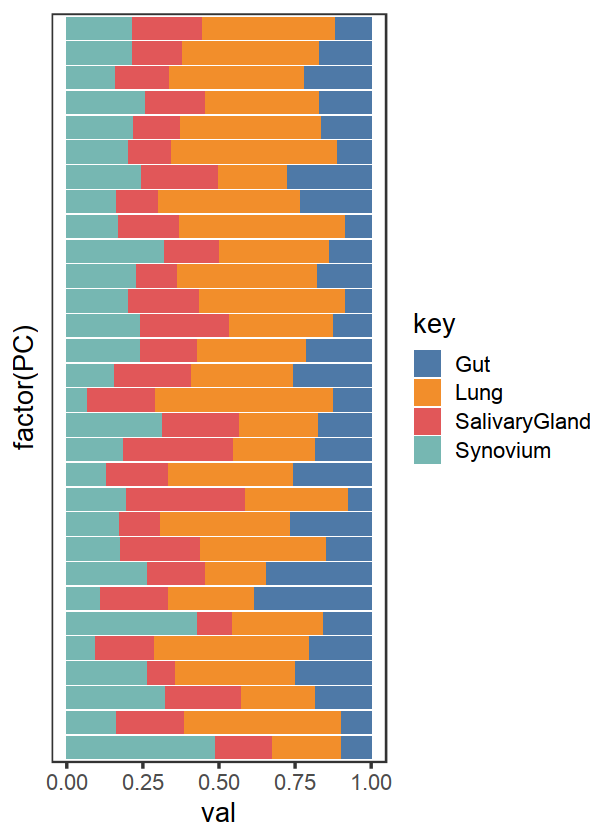

In [33]:
fig.size(7, 5)
# split.data.frame(t(obj$Z_cos), obj$meta_data$Tissue) %>% 
split.data.frame(obj$V, obj$meta_data$Tissue) %>% 
    map(function(.SD) {
        apply(.SD, 2, var)
#         sum(apply(.SD, 2, var))
    }) %>% 
    bind_cols() %>% 
    tibble::rowid_to_column('PC') %>% 
    tidyr::gather(key, val, -PC) %>% 
    subset(PC <= 30) %>% 
    ggplot(aes(factor(PC), val, fill = key)) + 
        geom_bar(stat = 'identity', position = 'fill') + 
        coord_flip() + 
        scale_fill_tableau() + 
        theme_test(base_size = 16) + 
        theme(
            axis.text.y = element_blank(),
            axis.ticks.y = element_blank()
        ) + 
        NULL


## Clean up 

In [ ]:
rm(data_tissues)
gc()

# Integration

## Harmony

In [36]:
do_harmony <- function(obj, vars, n_rounds=10, keep_intermediate=TRUE, ...) {

    if (keep_intermediate) {
        obj$.Z_cos <- list()
        obj$.Z_corr <- list()
        obj$.R <- list()
        obj$.betas <- list()

        hres <- HarmonyMatrix(
            obj$V, obj$meta_data, vars, 
            do_pca = FALSE, 
            max.iter.harmony = 1, 
            return_object = TRUE,
            ...
        )
        
        obj$.Z_cos[[1]] <- hres$Z_cos
        obj$.Z_corr[[1]] <- hres$Z_corr
        obj$.R[[1]] <- hres$R
        obj$.betas[[1]] <- harmony:::moe_ridge_get_betas(hres)
        for (iter in seq(2, n_rounds)) {
            harmony:::harmonize(hres, 1)
            obj$.Z_cos[[iter]] <- hres$Z_cos
            obj$.Z_corr[[iter]] <- hres$Z_corr
            obj$.R[[iter]] <- hres$R
            obj$.betas[[iter]] <- harmony:::moe_ridge_get_betas(hres)
        }  
        obj$Z_cos <- obj$.Z_cos[[n_rounds]]
        obj$Z_corr <- obj$.Z_corr[[n_rounds]]
        obj$R <- obj$.R[[n_rounds]]
        obj$betas <- obj$.betas[[n_rounds]]
        
    } else {
        hres <- HarmonyMatrix(
            obj$V, obj$meta_data, vars, 
            do_pca = FALSE, 
            max.iter.harmony = n_rounds, 
            return_object = TRUE,
            ...
        )
        obj$Z_cos <- hres$Z_cos
        obj$Z_corr <- hres$Z_corr
        obj$R <- hres$R
        obj$betas <- harmony:::moe_ridge_get_betas(hres)
    }
    
    obj$kmeans_rounds <- hres$kmeans_rounds
    obj$objective_kmeans <- hres$objective_kmeans
    obj$use_weights <- hres$use_weights
    obj$weights <- hres$weights
    
    return(obj)
}

In [37]:
set.seed(1)
fig.size(3, 5)
t_harmony <- system.time({
    obj <- do_harmony(
        obj, 
        c('LibraryID', 'Tissue'), 
        theta = c(0.3, 0.2), 
        tau = 5, ## at least 5 cells per cluster
        weights = obj$meta_data$weight, 
        ## do lots of iterations - we can wait 
        n_rounds=5, keep_intermediate=TRUE, max.iter.cluster=30, 
        epsilon.harmony = -Inf, epsilon.cluster = -Inf
    )
})
t_harmony



use_weights



[1] TRUE


use_weights

use_weights



[1] TRUE


use_weights

Harmony 1/1

Harmony 1/1

Harmony 1/1

Harmony 1/1

Harmony 1/1



     user    system   elapsed 
14309.599 15883.139  2436.166 

In [38]:
t_harmony[['elapsed']] / 60

[1] 40.60277

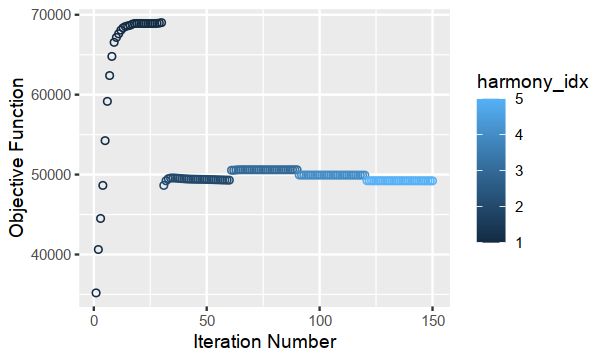

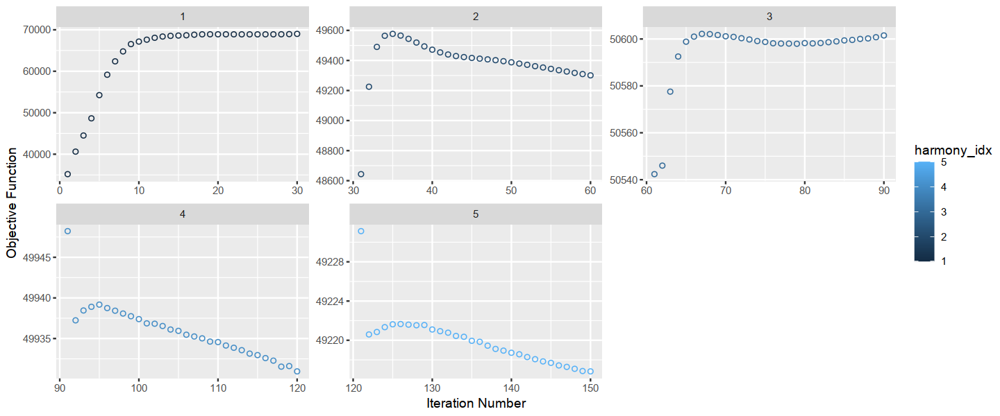

In [39]:
fig.size(3, 5)
harmony:::HarmonyConvergencePlot(obj)

fig.size(5, 12)
harmony:::HarmonyConvergencePlot(obj) + 
    facet_wrap(~harmony_idx, scales = 'free', nrow = 2) + 
        NULL


In [40]:
## ~70 minutes
t_harmony[['elapsed']] / 60


[1] 40.60277

## UMAP

In [41]:
## umap on intermediates 
do_umap_multi <- function(obj, ...) {
    res <- obj$.Z_cos %>% 
        future_map(function(Xt) {
            umap_after_fname <- tempfile(tmpdir = '/data/srlab2/ik936/Roche/data/cache', pattern = 'umap_')
            umap_res <- do_umap(t(Xt), umap_after_fname, ...)
            list(
                umap_after_fname = umap_after_fname, 
                umap_after = umap_res$embedding,
                adj_after = umap_res$adj,
                knn_after = umap_res$knn
            )
        })

    obj$.umap_after_fname <- list()
    obj$.umap_after <- list()
    obj$.adj_after <- list()
    obj$.knn_after <- list()

    for (i in seq(length(res))) {
        obj$.umap_after_fname[[i]] <- res[[i]]$umap_after_fname
        obj$.umap_after[[i]] <- res[[i]]$umap_after
        obj$.adj_after[[i]] <- res[[i]]$adj_after
        obj$.knn_after[[i]] <- res[[i]]$knn_after
    }

    return(obj)
}


In [42]:
future::plan(multiprocess)

set.seed(1)
system.time({    
    obj <- do_umap_multi(
#         obj, .spread=1, .min_dist=0.1
        obj, .spread=.3, .min_dist=0.05, .metric='euclidean', .n_components=2L
    )
})


Warning message:
“invalid uid value replaced by that for user 'nobody'”
Warning message:
“invalid uid value replaced by that for user 'nobody'”
Warning message:
“invalid uid value replaced by that for user 'nobody'”
Warning message:
“invalid uid value replaced by that for user 'nobody'”
Warning message:
“invalid uid value replaced by that for user 'nobody'”


   user  system elapsed 
518.807   9.322 103.903 

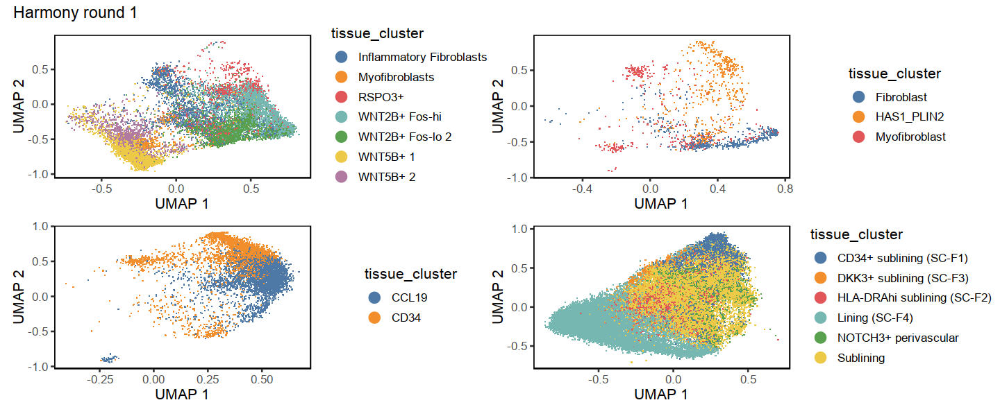

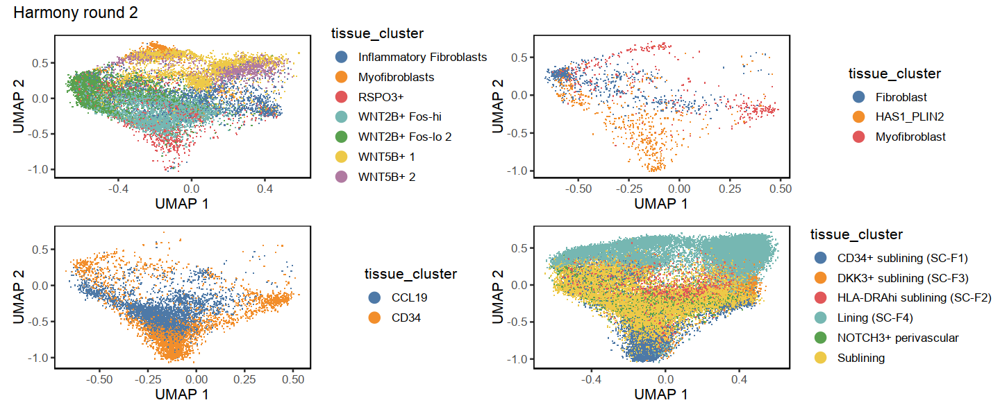

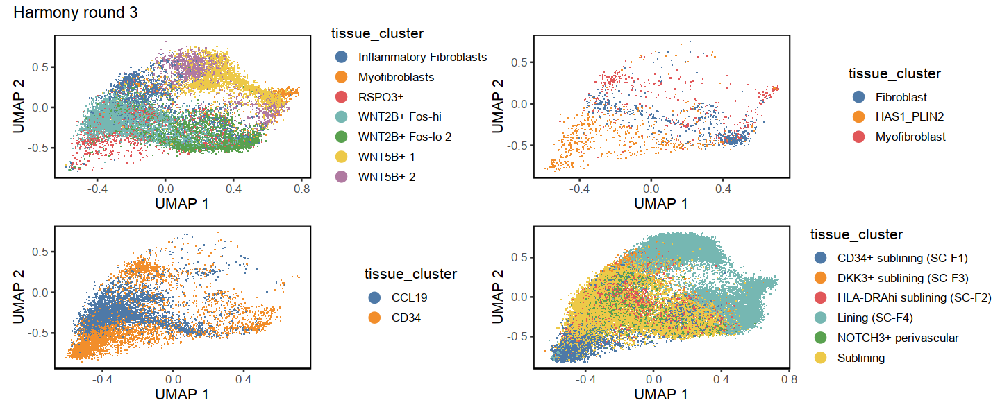

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]


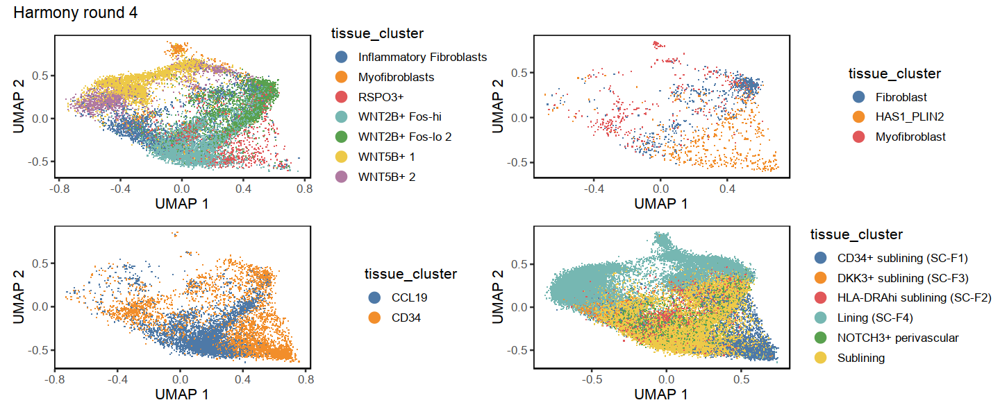

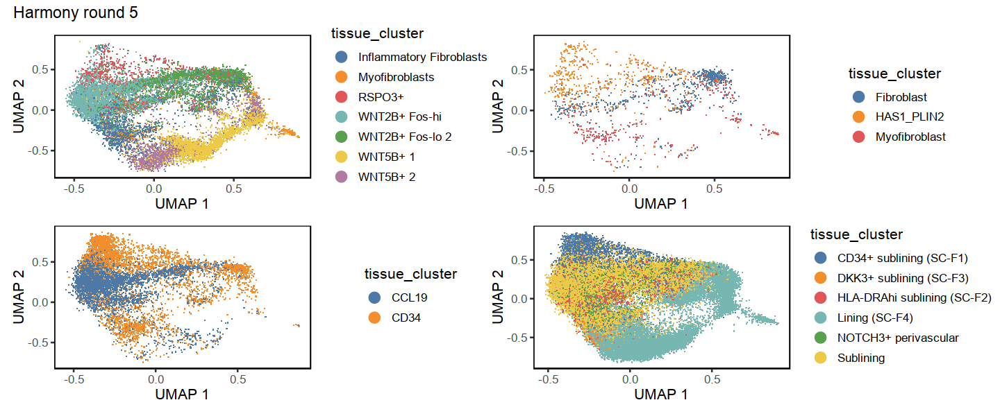

In [46]:
fig.size(5, 12)
obj$.umap_after %>% 
#     head(4) %>%
    imap(function(.SD, i) {
        split(seq(nrow(obj$meta_data)), obj$meta_data$Tissue) %>% 
            map(function(idx) {
                do_scatter(
    #                 obj$umap_after[idx, ], 
                    .SD[idx, ],
                    obj$meta_data[idx, ], 
                    'tissue_cluster', 
                    pt_size = 8, do_labels = FALSE, 
                    no_guides = FALSE,
                    palette_use = tableau_color_pal()(10)
                ) + 
    #                 xlim(-1.1, 1.2) + ylim(-1.35, 1.35) + 
                    NULL
            }) %>% 
            reduce(`+`) + 
        plot_annotation(title = glue::glue('Harmony round {i}'))
    })


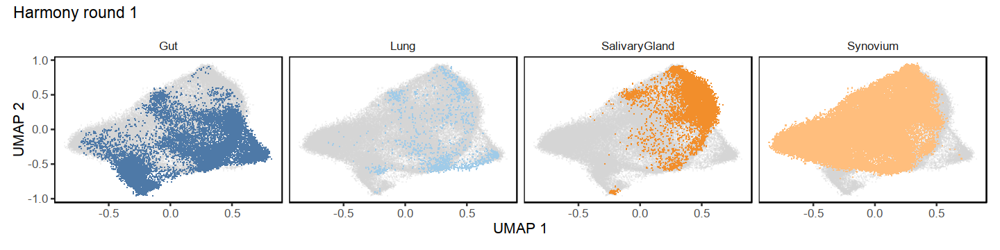

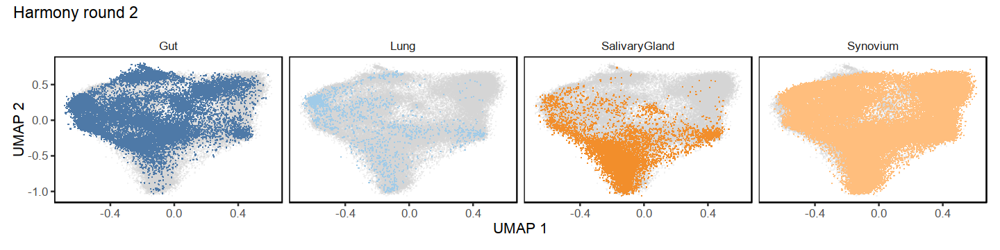

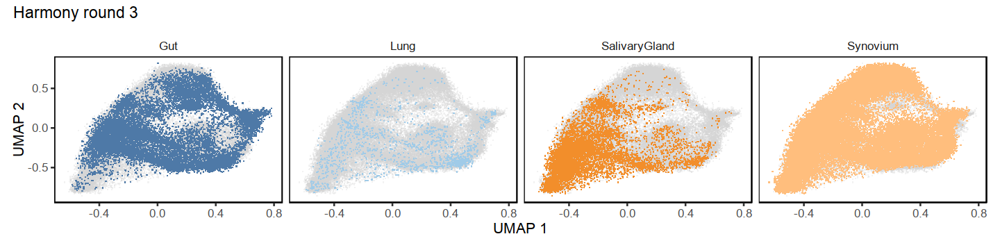

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]


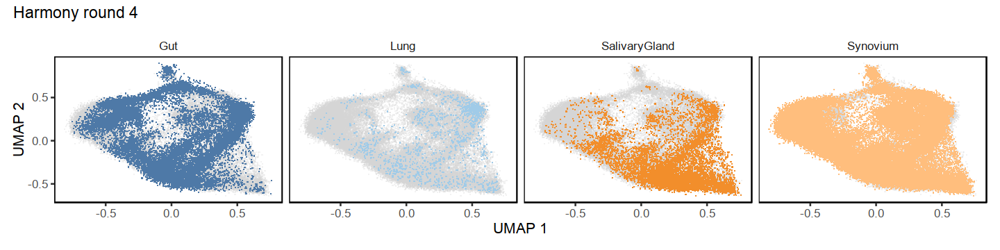

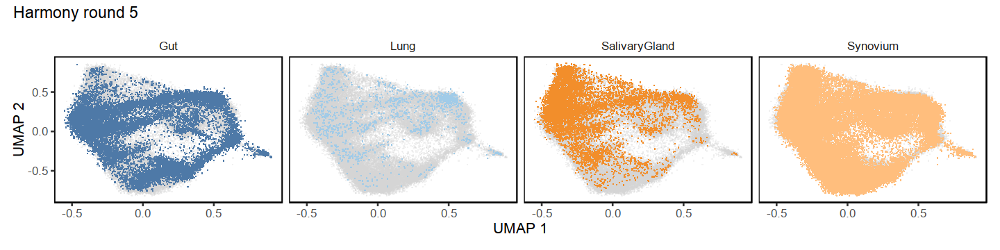

In [45]:
# fig.size(3, 12)
# do_scatter(obj$umap_before, obj$meta_data, 'Tissue', pt_size = 8) +
# do_scatter(obj$umap_after, obj$meta_data, 'Tissue', pt_size = 8)


fig.size(3, 12)
# do_scatter(obj$umap_after, obj$meta_data, 'Tissue', quo(Tissue), pt_size = 8, do_labels=FALSE, nrow=1)
obj$.umap_after %>% 
#     head(4) %>% 
    map(do_scatter, obj$meta_data, 'Tissue', quo(Tissue), pt_size = 8, do_labels=FALSE, nrow=1) %>% 
    imap(function(plt, i) {
        plt + plot_annotation(title = glue::glue('Harmony round {i}'))
    })
    


## Choose Harmony step 

In [119]:
i <- 5
obj$umap_after <- obj$.umap_after[[i]]
obj$umap_after_fname <- obj$.umap_after_fname[[i]]
obj$adj_after <- obj$.adj_after[[i]]
obj$knn_after <- obj$.knn_after[[i]]


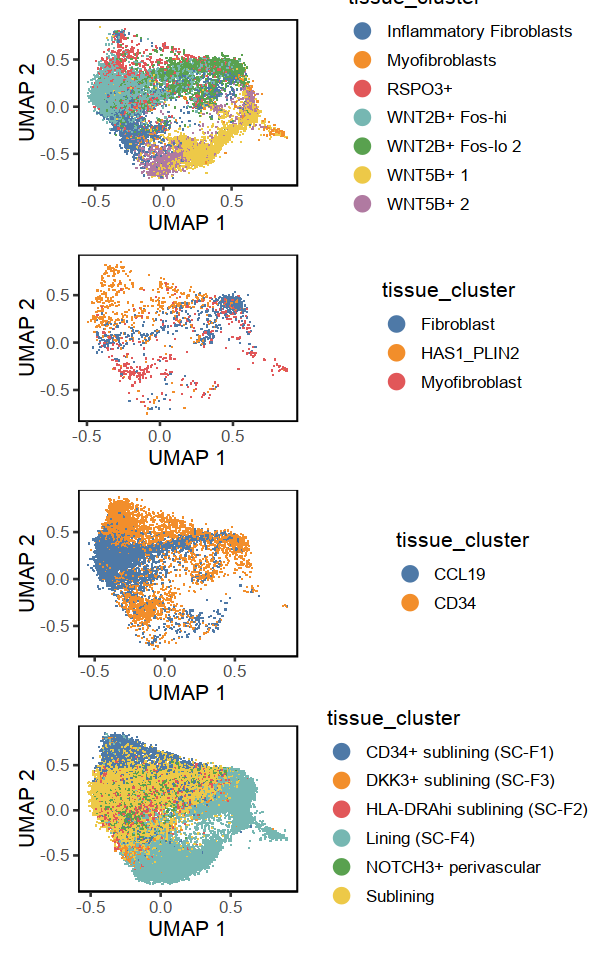

In [120]:
fig.size(8, 5)
# fig.size(5, 12)
split(seq(nrow(obj$meta_data)), obj$meta_data$Tissue) %>% 
    map(function(idx) {
        do_scatter(
            obj$umap_after[idx, ], obj$meta_data[idx, ], 
            'tissue_cluster', 
            palette_use = tableau_color_pal()(10),
            pt_size = 8, do_labels = FALSE, no_guides = FALSE
        )
    }) %>% 
    reduce(`+`) + 
    plot_layout(ncol = 1)


## Preservation of original clusters

Without correcting for donor or tissue, most of the variation in the original labels is well preserved. 


### Before Harmony

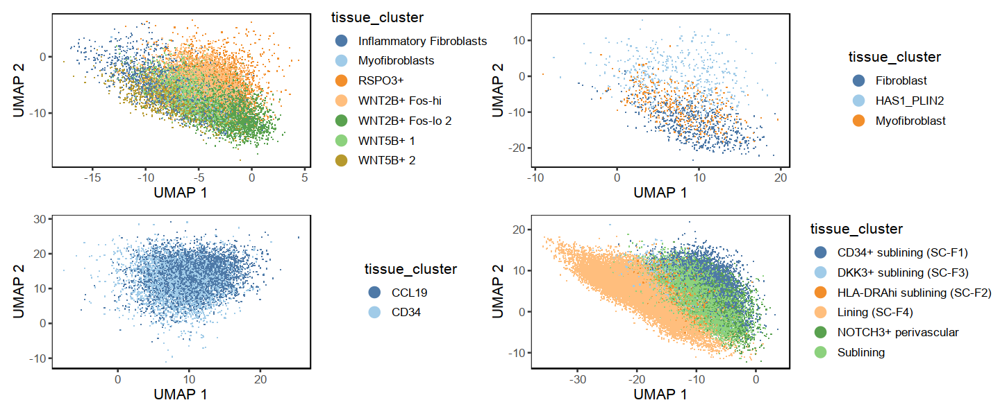

In [30]:
fig.size(5, 12)
split(seq(nrow(obj$meta_data)), obj$meta_data$Tissue) %>% 
    map(function(idx) {
        obj$V[idx, 1:2] %>% 
            data.frame() %>% 
            dplyr::rename(X1 = PC1, X2 = PC2) %>% 
            do_scatter(
                obj$meta_data[idx, ], 
                'tissue_cluster', 
                pt_size = 8, do_labels = FALSE, no_guides = FALSE
            )
    }) %>% 
    reduce(`+`)


#### Synovium

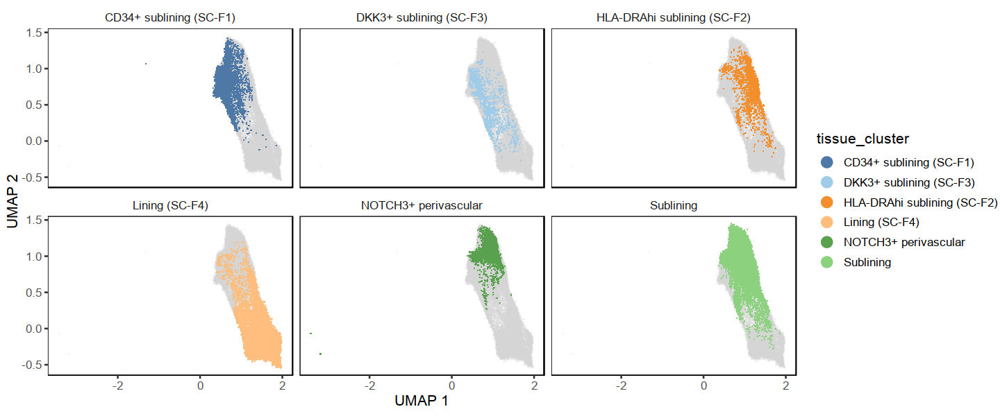

In [318]:
fig.size(5, 12)
idx <- which(obj$meta_data$Tissue == 'Synovium')
do_scatter(
    obj$umap_before[idx, ],
    obj$meta_data[idx, ], 
    'tissue_cluster', quo(tissue_cluster), 
    pt_size = 8, do_labels = FALSE, no_guides = FALSE,
    nrow = 2
)


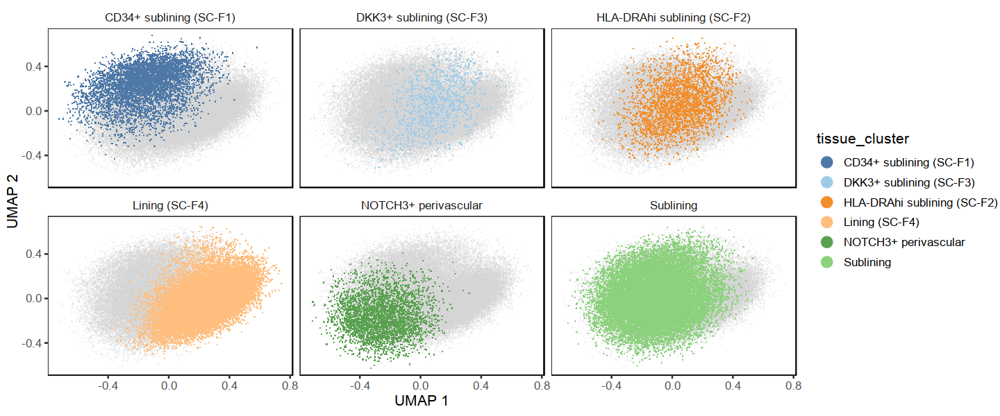

In [322]:
fig.size(5, 12)
idx <- which(obj$meta_data$Tissue == 'Synovium')
do_scatter(
    t(obj$Z_cos)[idx, c(1, 2)],
    obj$meta_data[idx, ], 
    'tissue_cluster', quo(tissue_cluster), 
    pt_size = 8, do_labels = FALSE, no_guides = FALSE,
    nrow = 2
)


### After Harmony

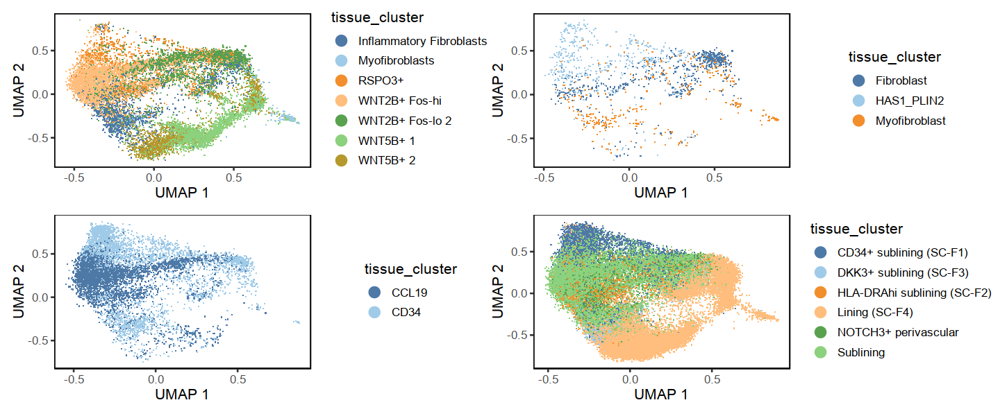

In [13]:
fig.size(5, 12)
split(seq(nrow(obj$meta_data)), obj$meta_data$Tissue) %>% 
    map(function(idx) {
        do_scatter(
            obj$umap_after[idx, ], obj$meta_data[idx, ], 
            'tissue_cluster', 
            pt_size = 8, do_labels = FALSE, no_guides = FALSE
        )
    }) %>% 
    reduce(`+`)


#### Synovium

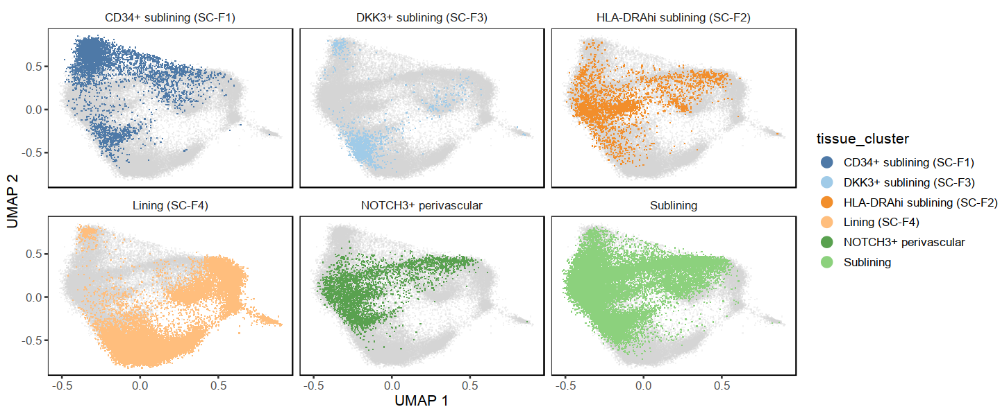

In [10]:
fig.size(5, 12)
idx <- which(obj$meta_data$Tissue == 'Synovium')
do_scatter(
    obj$umap_after[idx, ],
    obj$meta_data[idx, ], 
    'tissue_cluster', quo(tissue_cluster), 
    pt_size = 8, do_labels = FALSE, no_guides = FALSE,
    nrow = 2
)


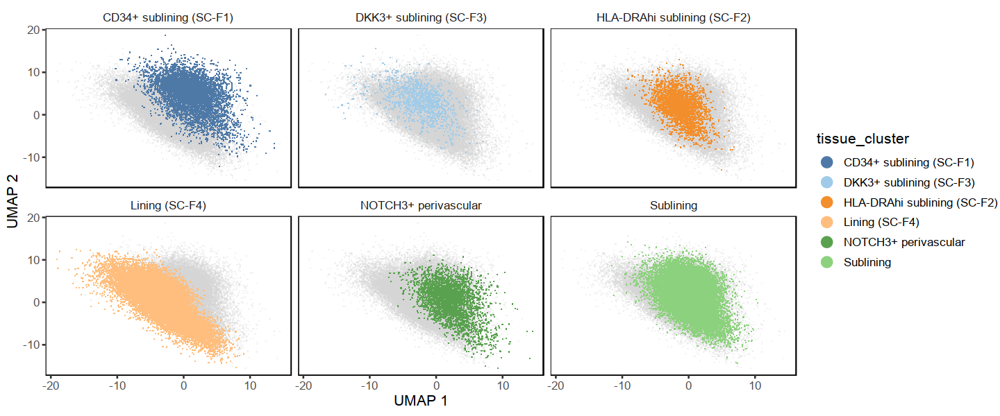

In [25]:
fig.size(5, 12)
idx <- which(obj$meta_data$Tissue == 'Synovium')
do_scatter(
    t(obj$Z_corr)[idx, ], 
    obj$meta_data[idx, ], 
    'tissue_cluster', quo(tissue_cluster), 
    pt_size = 8, do_labels = FALSE, no_guides = FALSE,
    nrow = 2
)


#### Lung

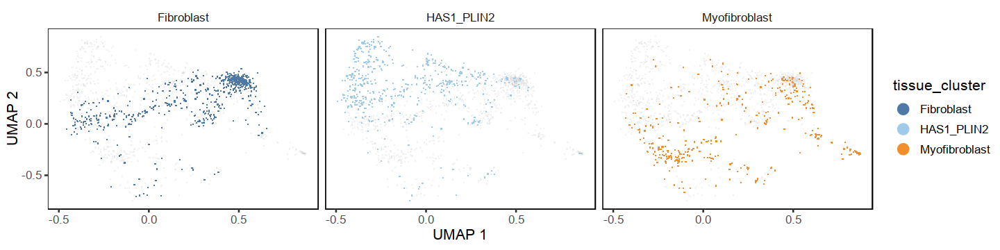

In [11]:
fig.size(3, 12)
idx <- which(obj$meta_data$Tissue == 'Lung')
do_scatter(
    obj$umap_after[idx, ],    obj$meta_data[idx, ], 
    'tissue_cluster', quo(tissue_cluster), 
    pt_size = 8, do_labels = FALSE, no_guides = FALSE,
    nrow = 1
)


#### Gut

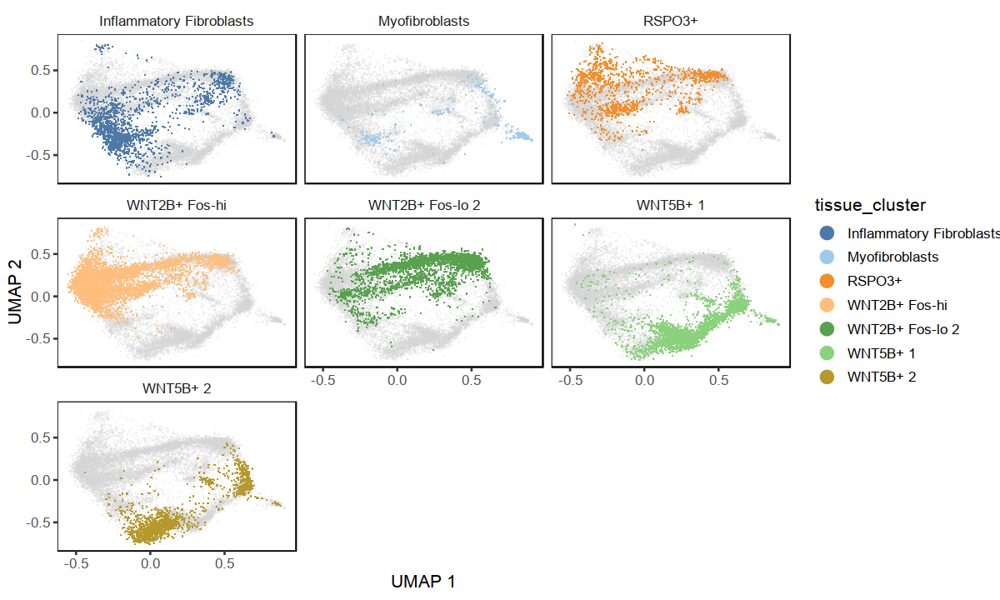

In [12]:
fig.size(6, 10)
idx <- which(obj$meta_data$Tissue == 'Gut')
do_scatter(
    obj$umap_after[idx, ],
#     obj$.umap_after[[2]][idx, ],
    obj$meta_data[idx, ], 
    'tissue_cluster', quo(tissue_cluster), 
    pt_size = 8, do_labels = FALSE, no_guides = FALSE,
    nrow = 3
)


# Clusters

In [121]:
do_cluster <- function(
    obj, adj_name, resolutions,
    force_snn=FALSE,
    append_cols=FALSE,
    do_weights = FALSE, 
    slot_name = 'clusters_df',
    ...
) {
    ## cluster 
    library(singlecellmethods)

    ## For now, just always do parallel
    future::plan(multicore) 
    
    
    ## adjacency matrix itself
    adj_use <- obj[[adj_name]]
    
    ## SNN
#     adj_use <- Matrix::tcrossprod(obj[[adj_name]]) %>% as('dgCMatrix') %>% drop0()

    adj_size <- as.integer(pryr::object_size(adj_use))
    if (adj_size > 5e8) {
        options(future.globals.maxSize=1.5*adj_size)
    }
    
    res_new <- future_map(resolutions, function(resolution) {
        message(resolution)
        as.character(Seurat:::RunModularityClustering(adj_use, resolution = resolution, print.output = FALSE, ...))
    }) %>% 
        bind_cols()
    message('finished Louvain')
    
    res_new <- apply(res_new, 2, as.character)    
    if (append_cols) {
        obj[[slot_name]] <- cbind(obj[[slot_name]], res_new)
    } else {
        obj[[slot_name]] <- res_new
    }
    obj[[slot_name]] <- data.frame(obj[[slot_name]])
    
    colnames(obj[[slot_name]]) <- paste0('res', seq(ncol(obj[[slot_name]])))
    
    return(obj)
}


## Louvain


In [122]:
future::plan(multiprocess)

## <1 minute for adj
## ~7 minutes for adj^2
set.seed(3)
t_cluster <- system.time({
    obj <- do_cluster(
        obj, 'adj_after', c(.1, .3, .5, .8, 1.0, 1.2, 1.5, 1.8, 2.1),
        append_cols = FALSE, 
        force_snn = TRUE,
        slot_name = 'clusters_df', 
        do_weights = FALSE,
        algorithm = 1 ## Louvain
    )
})


0.1

0.3

0.5

0.8

1

1.2

1.5

1.8

2.1

New names:
* NA -> ...1
* NA -> ...2
* NA -> ...3
* NA -> ...4
* NA -> ...5
* ...

finished Louvain



In [123]:
## ~30 seconds 
t_cluster[['elapsed']] / 60


[1] 0.54165

In [124]:
obj$clusters_df %>% map(unique) %>% map(length)

$res1
[1] 3

$res2
[1] 6

$res3
[1] 8

$res4
[1] 10

$res5
[1] 14

$res6
[1] 15

$res7
[1] 20

$res8
[1] 25

$res9
[1] 27

In [125]:
head(obj$clusters_df)

,res1,res2,res3,res4,res5,res6,res7,res8,res9
,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
1,0,3,3,2,5,5,5,2,3
2,0,1,0,1,2,1,0,0,0
3,1,0,4,5,4,2,12,17,19
4,2,2,2,3,1,10,16,21,15
5,0,3,3,2,5,5,5,2,3
6,2,2,2,3,1,3,2,1,1


Warning message:
“Ignoring unknown parameters: segment.size”
Warning message:
“Ignoring unknown parameters: label.size, segment.size”
Warning message:
“Ignoring unknown parameters: segment.size”
Warning message:
“Ignoring unknown parameters: label.size, segment.size”
Warning message:
“Ignoring unknown parameters: segment.size”
Warning message:
“Ignoring unknown parameters: label.size, segment.size”
Warning message:
“Ignoring unknown parameters: segment.size”
Warning message:
“Ignoring unknown parameters: label.size, segment.size”
Warning message:
“Ignoring unknown parameters: segment.size”
Warning message:
“Ignoring unknown parameters: label.size, segment.size”
Warning message:
“Ignoring unknown parameters: segment.size”
Warning message:
“Ignoring unknown parameters: label.size, segment.size”
Warning message:
“Ignoring unknown parameters: segment.size”
Warning message:
“Ignoring unknown parameters: label.size, segment.size”
Warning message:
“Ignoring unknown parameters: segment.size”
W

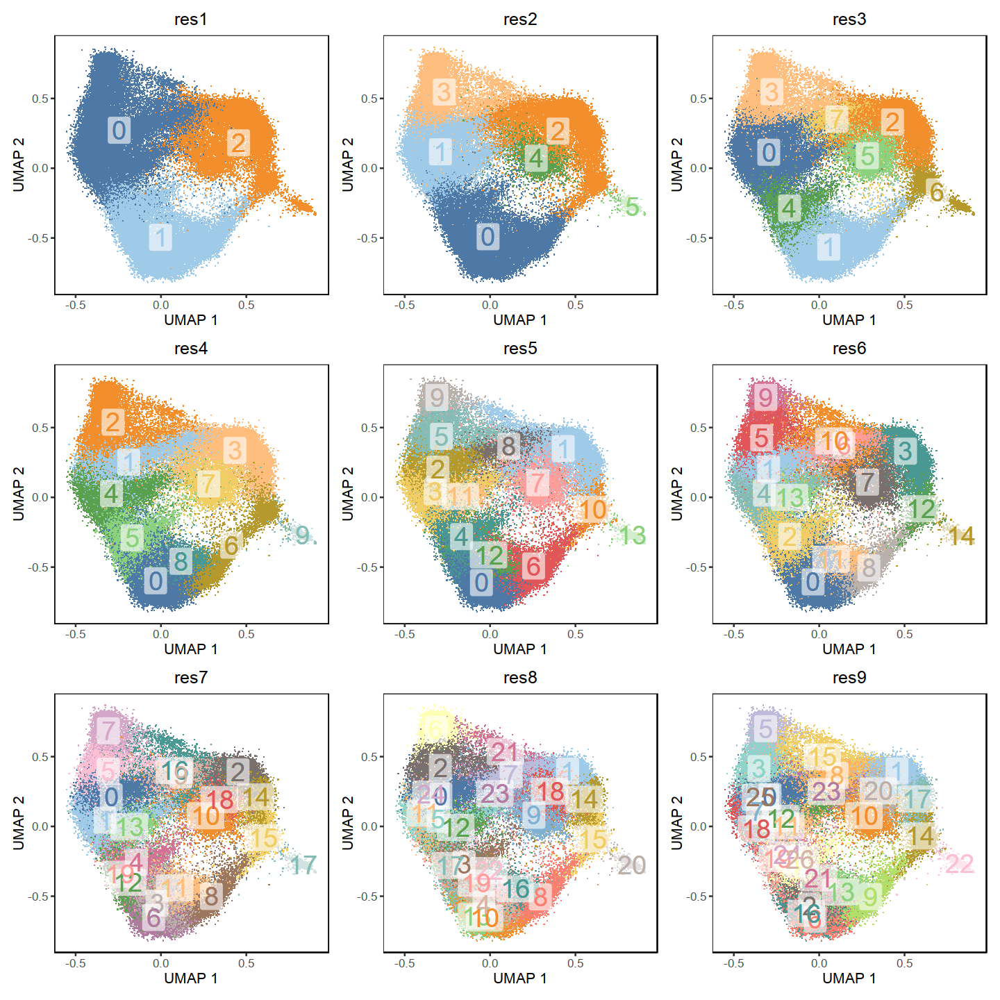

In [139]:
fig.size(12, 12)
plot_clusters(obj, 'umap_after', slot_name = 'clusters_df')


## Decide on resolution 

In [127]:
obj$meta_data$Cluster <- factor(obj$clusters_df$res5, 0:50) 


Warning message:
“Ignoring unknown parameters: segment.size”
Warning message:
“Ignoring unknown parameters: label.size, segment.size”


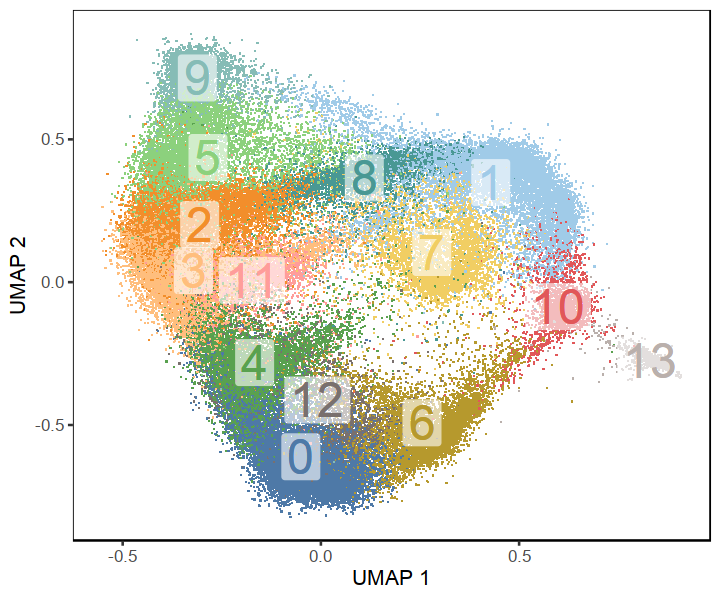

In [128]:
fig.size(5, 6)
do_scatter(
    obj$umap_after, 
    obj$meta_data,
#     cbind(obj$meta_data, obj$clusters_df_u), 
    pt_size = 10, ## fontsize 
    'Cluster', do_labels = TRUE
)

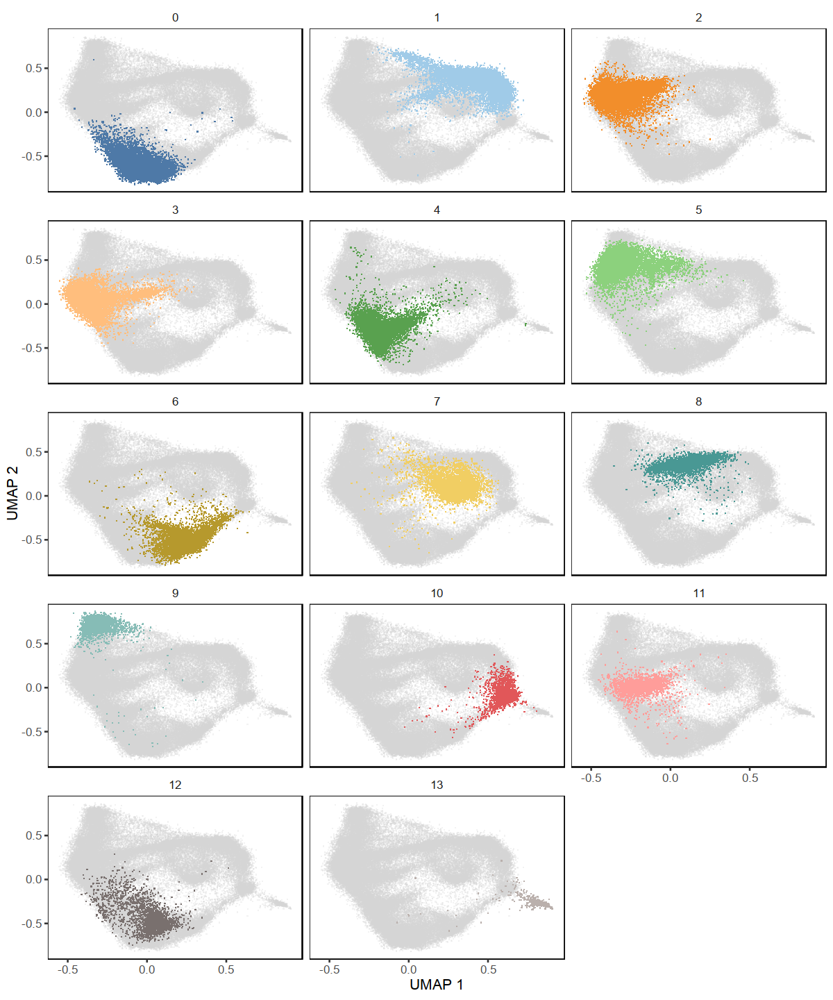

In [129]:
fig.size(12, 10)
do_scatter(
    obj$umap_after, obj$meta_data, 
    'Cluster', quo(Cluster), nrow = 5, do_labels = FALSE
)


## % mito and doublets


Picking joint bandwidth of 0.00493

Picking joint bandwidth of 0.0131

Picking joint bandwidth of 0.0103

Picking joint bandwidth of 0.00441



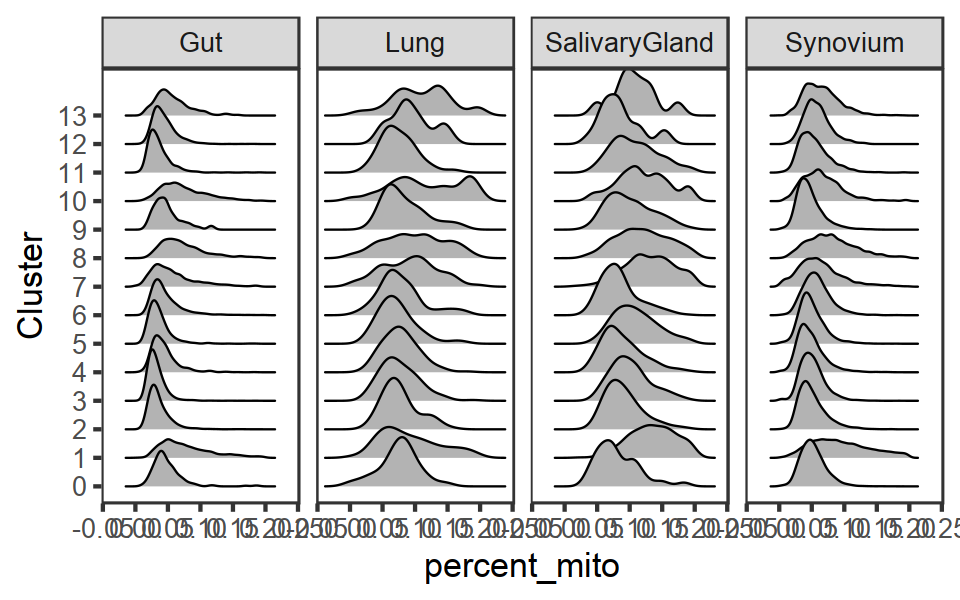

In [62]:
fig.size(5, 8)
obj$meta_data %>% 
    ggplot(aes(percent_mito, Cluster)) + 
        geom_density_ridges() +
        facet_grid(~Tissue) + 
        theme_test(base_size = 20)


Picking joint bandwidth of 0.0269

Picking joint bandwidth of 0.0414

Picking joint bandwidth of 0.0207

Picking joint bandwidth of 0.0314



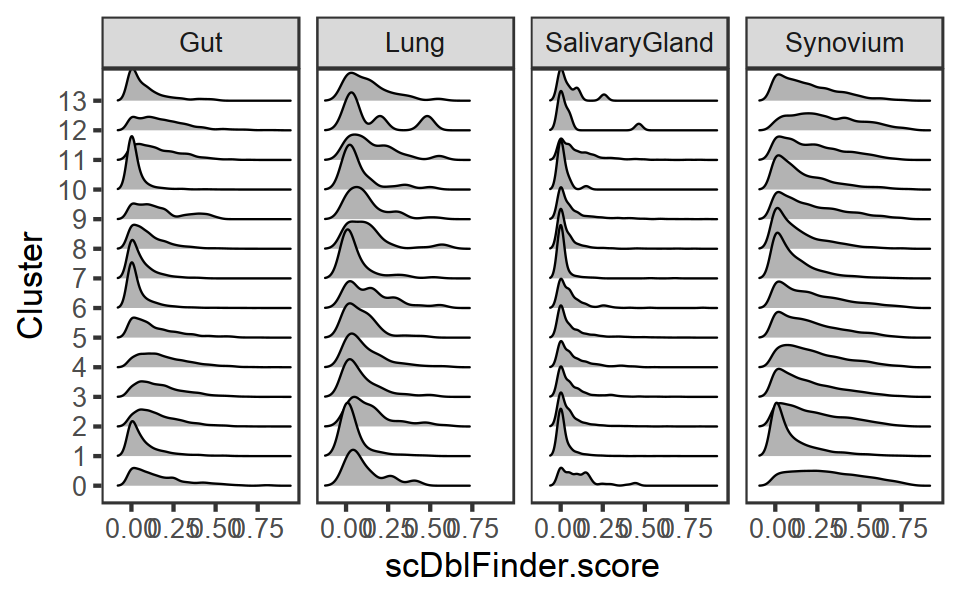

In [61]:
fig.size(5, 8)
obj$meta_data %>% 
    ggplot(aes(scDblFinder.score, Cluster)) + 
        geom_density_ridges() +
        facet_grid(~Tissue) + 
        theme_test(base_size = 20)


In [64]:
with(obj$meta_data, table(Tissue, as.character(Cluster)))

               
Tissue              0     1    10    11    12    13     2     3     4     5
  Gut             349  2653  1203   541  1057   344  2136  1961   723   670
  Lung             28   505    29    36     5    38   108   128   119   141
  SalivaryGland    69   811    18   352    18    10  1769   422   631  1807
  Synovium      11093  6728  1202  1473  1087  1025  5237  4947  5680  4012
               
Tissue              6     7     8     9
  Gut            2148   606  1433    85
  Lung             49   112    89    55
  SalivaryGland   222   257   426   662
  Synovium       3700  3762  2085  3112

## Cluster QC 

In [ ]:
fig.size(6, 8)
obj$meta_data %>% 
    ggplot(aes(scDblFinder.ratio, reorder(Cluster, scDblFinder.ratio))) + 
#     ggplot(aes(scDblFinder.score, reorder(Cluster, scDblFinder.score))) + 
        geom_density_ridges() + 
#          geom_density_ridges(aes(fill = Tissue), alpha = .3, color = NA) + 
        theme_test(base_size = 16) + 
        scale_fill_tableau() + 
        facet_wrap(~Tissue, nrow = 1, scales = 'free_x') + 
        NULL


In [ ]:
fig.size(6, 12)
obj$meta_data %>% 
    ggplot(aes(nGene, reorder(Cluster, nGene))) + 
#     ggplot(aes(percent_mito, reorder(Cluster, percent_mito))) + 
        geom_density_ridges() + 
        geom_density_ridges(aes(fill = Tissue), color = NA, alpha = .4) + 
        theme_test(base_size = 20) + 
        scale_fill_tableau() + 
        scale_color_tableau() + 
        scale_x_log10() + 
        geom_vline(xintercept = c(500, 1000), linetype = 2) + 
obj$meta_data %>% 
    ggplot(aes(percent_mito, reorder(Cluster, percent_mito))) + 
        geom_density_ridges() + 
        geom_density_ridges(aes(fill = Tissue), color = NA, alpha = .4) + 
        theme_test(base_size = 20) + 
        scale_fill_tableau() + 
        scale_color_tableau() + 
#         geom_vline(xintercept = 1000, linetype = 2) + 
        geom_vline(xintercept = .05, linetype = 2) + 
        NULL


## Downsampled Umap (post Harmony)

In [115]:
## downsample to the smallest tissue
nkeep <- min(table(obj$meta_data$Tissue))
nkeep

[1] 1442

In [116]:
set.seed(4)
meta_down <- obj$meta_data %>% 
#     dplyr::select(-Cluster) %>% 
#     cbind(Cluster = obj$clusters_df_u$res6) %>% 
# meta_down <- cbind(obj$meta_data, obj$clusters_df_u) %>% 
    split(obj$meta_data$Tissue) %>% 
    lapply(function(.SD) {
        frac_keep <- nkeep / nrow(.SD)
        .SD %>% 
            dplyr::group_by(Cluster) %>% 
            dplyr::sample_frac(frac_keep) %>% 
            dplyr::ungroup()
    }) %>%
    dplyr::bind_rows()


Sanity checks

In [117]:
message('Should be equal')
table(meta_down$Tissue)


message('Should be 0')
props_orig <- obj$meta_data %>% 
    cbind(obj$clusters_df_u) %>% 
    with(table(Tissue, res2)) %>% prop.table(1) %>% round(2)

props_down <- meta_down %>% 
    with(table(Tissue, res2)) %>% prop.table(1) %>% round(2)

props_orig - props_down

In [119]:
Z_down <- data.frame(t(obj$Z_cos), row.names = obj$meta_data$CellID)[meta_down$CellID, ]
umap_object <- do_umap(Z_down)
U_down <- umap_object$embedding


Warning message:
“Ignoring unknown parameters: segment.size”
Warning message:
“Ignoring unknown parameters: label.size, segment.size”


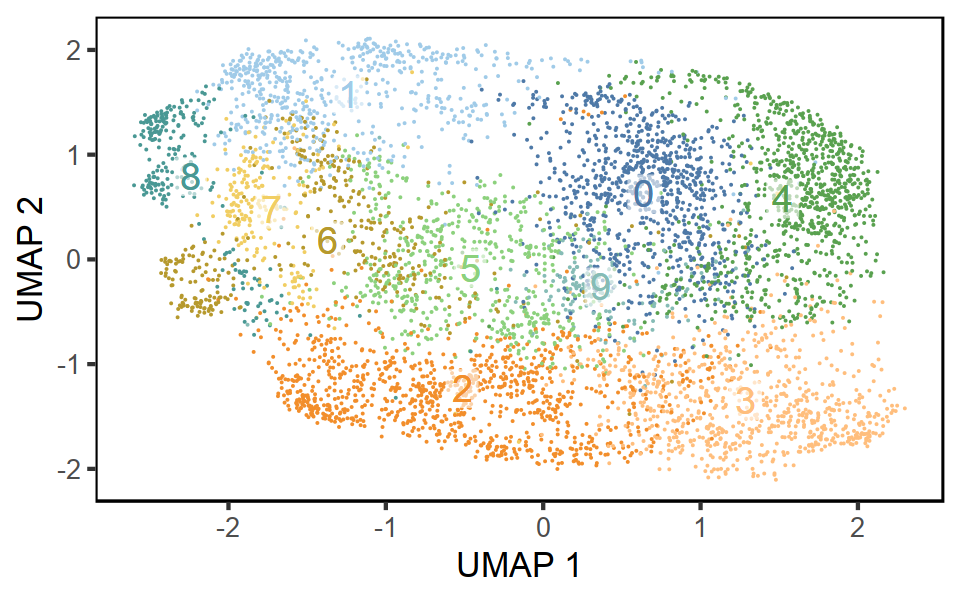

In [120]:
fig.size(5, 8)
do_scatter(U_down, meta_down, 'Cluster', pt_size = 12, base_size = 20, pt_shape = 16)


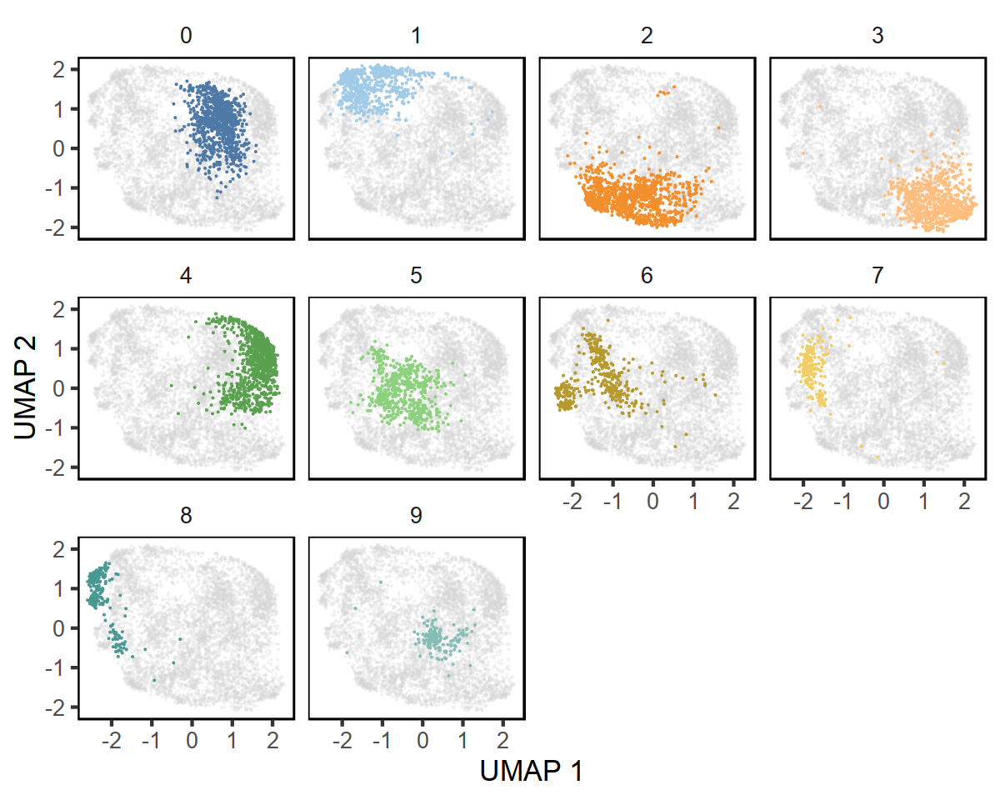

In [121]:
fig.size(8, 10)
do_scatter(
    U_down, meta_down, 'Cluster', quo(Cluster),
    pt_size = 8, base_size = 20, nrow = 3, pt_shape = 16, do_label = FALSE)


In [122]:
obj$meta_down <- meta_down
obj$Z_down <- Z_down
obj$U_down <- U_down
obj$umap_object <- umap_object
obj$uwot_obj_path <- '/data/srlab2/ik936/Roche/data/cache/uwot_fibroblasts_down.rds'
# uwot::save_uwot(umap_object, file = obj$uwot_obj_path)#, unload = FALSE, verbose = FALSE)


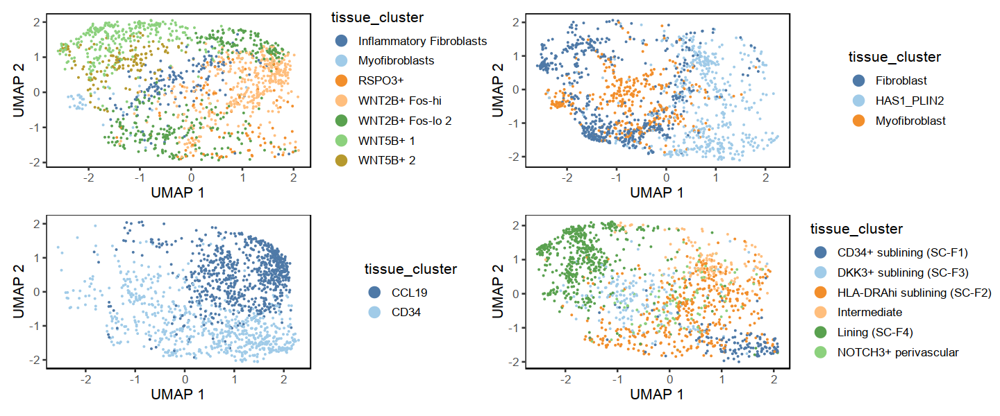

In [123]:
fig.size(5, 12)
split(seq(nrow(obj$meta_down)), obj$meta_down$Tissue) %>% 
    map(function(idx) {
        do_scatter(
            obj$U_down[idx, ], obj$meta_down[idx, ], 
            'tissue_cluster', 
            pt_size = 8, pt_shape = 16, 
            do_labels = FALSE, no_guides = FALSE
        )
    }) %>% 
    reduce(`+`)

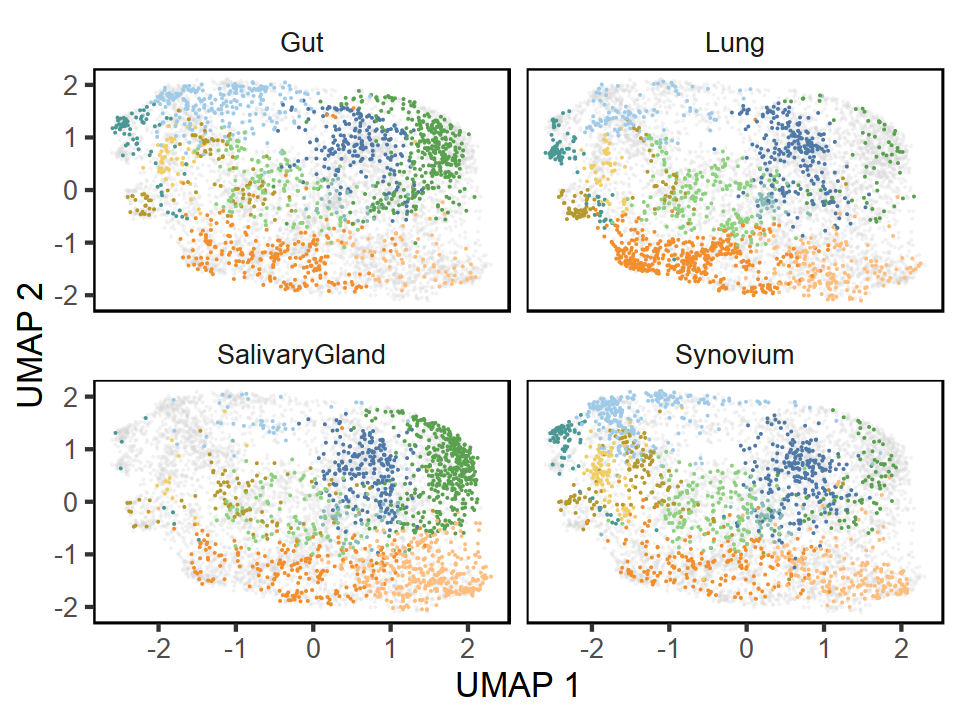

In [124]:
fig.size(6, 8)
do_scatter(
    obj$U_down, obj$meta_down, 'Cluster', quo(Tissue), 
    pt_size = 8, base_size = 20, pt_shape = 16, nrow = 2,
    do_labels = F
)


# MASC

In [ ]:
obj$masc <- list()


## per-tissue (joint scores)

In [35]:
future::plan(multiprocess) 
options(future.globals.maxSize=5e8) ## 500MB for futures


## define this outside of obj so futures doesn't copy obj each time 
data_df <- obj$meta_data %>% 
    dplyr::mutate(
        Cluster = as.character(Cluster),
        Tissue = as.character(Tissue)
    ) %>% 
#     left_join(
#         readRDS('/data/srlab2/ik936/Roche/data/cache/inflam_scores_icdf.rds')
#     ) %>% 
    dplyr::mutate(
#         InflamScore_beta = scale(InflamScore_beta), ## more stable MASC? 
        percent_mito = scale(percent_mito),
        scDblFinder.score = scale(scDblFinder.score)
    ) %>% 
    identity()


In [36]:
head(data_df)

,CellID,LibraryID,nGene,nUMI,percent_mito,SampleID,Technology,Tissue,DonorID,Case,⋯,Name_conserved,Name_overall,Cluster_name,InflamScore,InflamScore_raw,percent_cd45,q,percent_cd45_rescaled,percent_cd45_betaU,percent_cd45_beta3
,<chr>,<chr>,<dbl>,<dbl>,"<dbl[,1]>",<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AAACGCTCAGTTGTCA_GX44,GX44,2335,6313,0.7744472,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,CD34+FBLN1+,CD34+FBLN1+,FBLN1+ C5,0.3297227,0.1598264,23.95422,0.2857143,0.2226372,0.1513226,0.3813335
2,AAACGCTTCCTTATAC_GX44,GX44,3113,11020,0.8702009,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,JUN+FOS+,JUN+FOS+,C2,0.3297227,0.1598264,23.95422,0.2857143,0.2226372,0.1513226,0.3813335
3,AAAGGATTCTGCATGA_GX44,GX44,2367,5787,2.2147136,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,ADAM12+SPARC+,ADAM12+SPARC+,SPARC+COL3A1+ C4,0.3297227,0.1598264,23.95422,0.2857143,0.2226372,0.1513226,0.3813335
4,AAAGGATTCTTTCCAA_GX44,GX44,1992,5306,3.1900766,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,FN1+,COL6A6+,C1,0.3297227,0.1598264,23.95422,0.2857143,0.2226372,0.1513226,0.3813335
5,AAAGGGCAGAGTGTTA_GX44,GX44,2417,7568,0.3502967,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,CD34+FBLN1+,CD34+FBLN1+,FBLN1+ C5,0.3297227,0.1598264,23.95422,0.2857143,0.2226372,0.1513226,0.3813335
6,AAAGGGCCATTGAGCT_GX44,GX44,1958,3356,0.8604197,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,FN1+,COL6A6+,C1,0.3297227,0.1598264,23.95422,0.2857143,0.2226372,0.1513226,0.3813335


In [41]:
t_masc <- system.time({
    masc_res <- expand.grid(
        cluster_test = unique(data_df$Cluster), 
#         cluster_test = c('4', '11'),
        tissue_test = unique(data_df$Tissue)
#         tissue_test = c('SalivaryGland')
    ) %>% 
    future_pmap(function(cluster_test, tissue_test, ...) {
        message(paste(cluster_test, tissue_test))
        data_use <- data_df %>% 
            dplyr::mutate(Response = case_when(
                Cluster == cluster_test ~ 1L,
                TRUE ~ 0L
            )) %>% 
            subset(Tissue == tissue_test)

            tryCatch({
                model <- glmer(
                    formula = Response ~ 1 + percent_cd45_beta3 + (scDblFinder.score+percent_mito||LibraryID), 
                    data = data_use, 
                    family = 'binomial'
                )
                tibble(
                    Cluster = cluster_test,
                    Tissue = tissue_test, 
                    Ncells = sum(data_use$Response == 1L),
                    beta = fixef(model)[['percent_cd45_beta3']] / log(2),
                    sigma = sqrt(vcov(model)['percent_cd45_beta3', 'percent_cd45_beta3']) / log(2),
                    r2 = performance::r2_mckelvey(model)
                ) %>% 
                dplyr::mutate(zscore = beta / sigma) %>% 
                dplyr::mutate(pvalue = 2 * pnorm(-abs(zscore))) %>% 
                return()

            }, error = function(e) {
                print(e)
                tibble(
                    Cluster = cluster_test,
                    Tissue = tissue_test, 
                    Ncells = sum(data_use$Response == 1L),
                    beta = NA,
                    sigma = NA
                ) %>% 
                return()

            })

    }) %>% bind_rows()
})


5 SalivaryGland

2 SalivaryGland

4 SalivaryGland

1 SalivaryGland

9 SalivaryGland

11 SalivaryGland

boundary (singular) fit: see ?isSingular

7 SalivaryGland

boundary (singular) fit: see ?isSingular

6 SalivaryGland

8 SalivaryGland

3 SalivaryGland

boundary (singular) fit: see ?isSingular

12 SalivaryGland

boundary (singular) fit: see ?isSingular

10 SalivaryGland

boundary (singular) fit: see ?isSingular

0 SalivaryGland

boundary (singular) fit: see ?isSingular

13 SalivaryGland

boundary (singular) fit: see ?isSingular

5 Gut

2 Gut

4 Gut

1 Gut

9 Gut

boundary (singular) fit: see ?isSingular

11 Gut

7 Gut

6 Gut

8 Gut

3 Gut

12 Gut

10 Gut

0 Gut

13 Gut

5 Lung

Warning message in checkConv(attr(opt, "derivs"), opt$par, ctrl = control$checkConv, :
“Model failed to converge with max|grad| = 0.0460261 (tol = 0.002, component 1)”
2 Lung

4 Lung

1 Lung

boundary (singular) fit: see ?isSingular

9 Lung

boundary (singular) fit: see ?isSingular

11 Lung

boundary (singular)

In [47]:
## save in object 
obj$masc <- masc_res


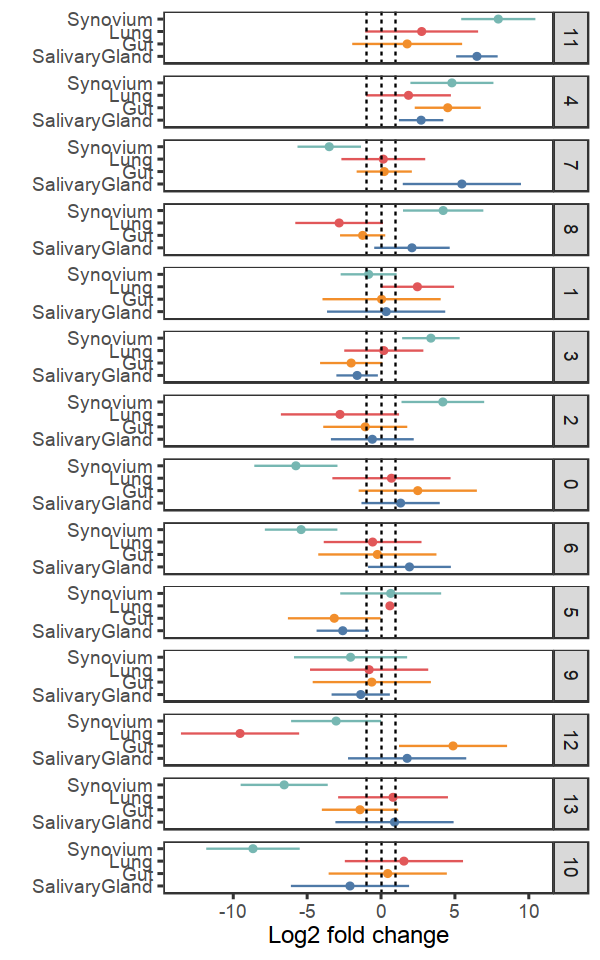

In [48]:
cluster_levels <- data.table(bind_rows(obj$masc))[, .(Z = mean(beta)), by = Cluster][order(-Z), Cluster]

fig.size(8, 5)
# data.table(obj$masc$pertissue_sc)[, sum(beta > 0), by = .(Cluster)][V1 >= 2][, V1 := NULL][] %>% 
#     inner_join(obj$masc$pertissue_sc) %>%
obj$masc %>% 
    dplyr::mutate(Cluster = factor(Cluster, cluster_levels)) %>% 
    dplyr::mutate(sigma = pmin(sigma, 2)) %>% 
#     subset(Cluster %in% c(=)) %>% 
#     dplyr::mutate(
#         q025 = pmax(-1.96 * sigma + beta, -5),
#         q975 = pmin(1.96 * sigma + beta, 5)
#     ) %>% 
    ggplot(aes(Tissue, beta, color = Tissue)) + 
        geom_point() + 
        geom_errorbar(aes(ymin = beta - 2 * sigma, ymax = beta + 2 * sigma), width = 0) + 
#         geom_errorbar(aes(ymin = q025, ymax = q975), width = 0) + 
        coord_flip() + 
        theme_test(base_size = 14) + 
        scale_color_tableau() + 
        facet_grid(Cluster~., space = 'free', scales = 'free') + 
        geom_hline(yintercept = c(-1, 0, 1), linetype = 2) + 
        labs(x = '', y = 'Log2 fold change') + 
        guides(color = FALSE) + 
#         scale_y_continuous(breaks = seq(-5, 5)) + 
#         ylim(-5, 5) + 
        NULL


## per-tissue (raw scores)

In [5]:
future::plan(multiprocess) 
options(future.globals.maxSize=5e8) ## 500MB for futures


## define this outside of obj so futures doesn't copy obj each time 
data_df <- obj$meta_data %>% 
    dplyr::mutate(
        Cluster = as.character(Cluster),
        Tissue = as.character(Tissue)
    ) %>% 
#     left_join(
#         readRDS('/data/srlab2/ik936/Roche/data/cache/inflam_scores_icdf.rds')
#     ) %>% 
    dplyr::mutate(
#         InflamScore_beta = scale(InflamScore_beta), ## more stable MASC? 
        percent_mito = scale(percent_mito),
        scDblFinder.score = scale(scDblFinder.score)
    ) %>% 
    identity()


Joining, by = c("LibraryID", "Tissue")



In [49]:
head(data_df)

,CellID,LibraryID,nGene,nUMI,percent_mito,SampleID,Technology,Tissue,DonorID,Case,⋯,Name_conserved,Name_overall,Cluster_name,InflamScore,InflamScore_raw,percent_cd45,q,percent_cd45_rescaled,percent_cd45_betaU,percent_cd45_beta3
,<chr>,<chr>,<dbl>,<dbl>,"<dbl[,1]>",<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AAACGCTCAGTTGTCA_GX44,GX44,2335,6313,0.7744472,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,CD34+FBLN1+,CD34+FBLN1+,FBLN1+ C5,0.3297227,0.1598264,23.95422,0.2857143,0.2226372,0.1513226,0.3813335
2,AAACGCTTCCTTATAC_GX44,GX44,3113,11020,0.8702009,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,JUN+FOS+,JUN+FOS+,C2,0.3297227,0.1598264,23.95422,0.2857143,0.2226372,0.1513226,0.3813335
3,AAAGGATTCTGCATGA_GX44,GX44,2367,5787,2.2147136,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,ADAM12+SPARC+,ADAM12+SPARC+,SPARC+COL3A1+ C4,0.3297227,0.1598264,23.95422,0.2857143,0.2226372,0.1513226,0.3813335
4,AAAGGATTCTTTCCAA_GX44,GX44,1992,5306,3.1900766,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,FN1+,COL6A6+,C1,0.3297227,0.1598264,23.95422,0.2857143,0.2226372,0.1513226,0.3813335
5,AAAGGGCAGAGTGTTA_GX44,GX44,2417,7568,0.3502967,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,CD34+FBLN1+,CD34+FBLN1+,FBLN1+ C5,0.3297227,0.1598264,23.95422,0.2857143,0.2226372,0.1513226,0.3813335
6,AAAGGGCCATTGAGCT_GX44,GX44,1958,3356,0.8604197,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,FN1+,COL6A6+,C1,0.3297227,0.1598264,23.95422,0.2857143,0.2226372,0.1513226,0.3813335


In [50]:
t_masc <- system.time({
    masc_res_raw <- expand.grid(
        cluster_test = unique(data_df$Cluster), 
#         cluster_test = c('4'),
        tissue_test = unique(data_df$Tissue)
#         tissue_test = c('SalivaryGland')
    ) %>% 
    future_pmap(function(cluster_test, tissue_test, ...) {
        message(paste(cluster_test, tissue_test))
        data_use <- data_df %>% 
            dplyr::mutate(Response = case_when(
                Cluster == cluster_test ~ 1L,
                TRUE ~ 0L
            )) %>% 
            subset(Tissue == tissue_test)

            tryCatch({
                model <- glmer(
                    ## Fast
                    formula = Response ~ 1 + percent_cd45 + (scDblFinder.score+percent_mito||LibraryID), 
                    data = data_use, 
                    family = 'binomial'
                )
                tibble(
                    Cluster = cluster_test,
                    Tissue = tissue_test, 
                    Ncells = sum(data_use$Response == 1L),
                    beta = fixef(model)[['percent_cd45']] / log(2),
                    sigma = sqrt(vcov(model)['percent_cd45', 'percent_cd45']) / log(2),
                    r2 = performance::r2_mckelvey(model)
                ) %>% 
                dplyr::mutate(zscore = beta / sigma) %>% 
                dplyr::mutate(pvalue = 2 * pnorm(-abs(zscore))) %>% 
                return()

            }, error = function(e) {
                print(e)
                tibble(
                    Cluster = cluster_test,
                    Tissue = tissue_test, 
                    Ncells = sum(data_use$Response == 1L),
                    beta = NA,
                    sigma = NA
                ) %>% 
                return()

            })

    }) %>% bind_rows()
})


5 SalivaryGland

2 SalivaryGland

4 SalivaryGland

boundary (singular) fit: see ?isSingular

1 SalivaryGland

9 SalivaryGland

11 SalivaryGland

7 SalivaryGland

boundary (singular) fit: see ?isSingular

6 SalivaryGland

8 SalivaryGland

3 SalivaryGland

boundary (singular) fit: see ?isSingular

12 SalivaryGland

10 SalivaryGland

boundary (singular) fit: see ?isSingular

0 SalivaryGland

boundary (singular) fit: see ?isSingular

13 SalivaryGland

boundary (singular) fit: see ?isSingular

5 Gut

2 Gut

4 Gut

1 Gut

9 Gut

boundary (singular) fit: see ?isSingular

11 Gut

7 Gut

6 Gut

8 Gut

3 Gut

12 Gut

10 Gut

0 Gut

13 Gut

5 Lung

2 Lung

4 Lung

1 Lung

boundary (singular) fit: see ?isSingular

9 Lung

boundary (singular) fit: see ?isSingular

11 Lung

boundary (singular) fit: see ?isSingular

7 Lung

boundary (singular) fit: see ?isSingular

6 Lung

boundary (singular) fit: see ?isSingular

8 Lung

boundary (singular) fit: see ?isSingular

3 Lung

12 Lung

10 Lung

0 Lung

bou

In [51]:
## runtime (minutes)
t_masc[['elapsed']] / 60


[1] 3.905417

In [52]:
## save in object 
obj$masc_raw <- masc_res_raw


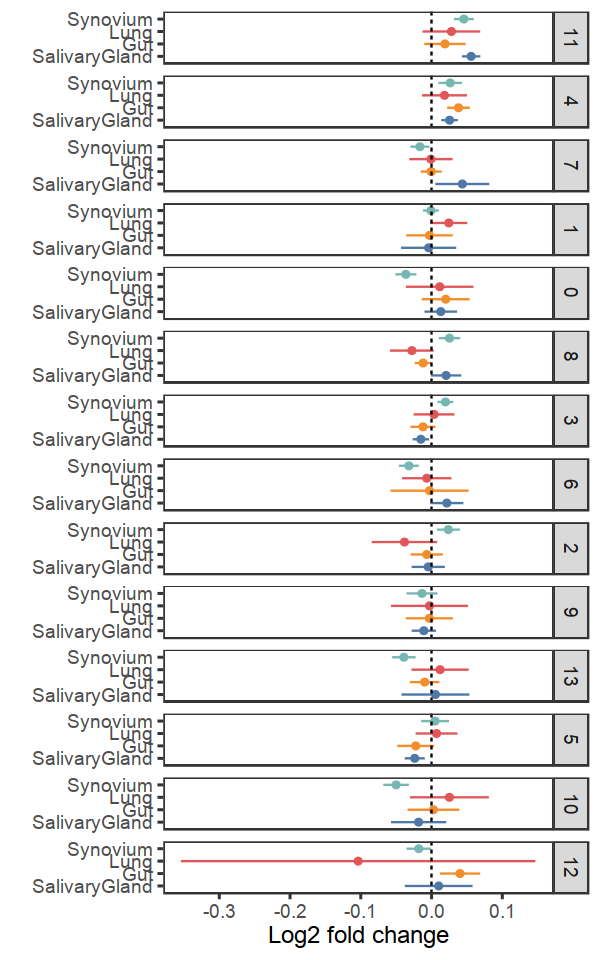

In [57]:
cluster_levels <- data.table(bind_rows(obj$masc_raw))[, .(Z = mean(beta)), by = Cluster][order(-Z), Cluster]

fig.size(8, 5)
# data.table(obj$masc$pertissue_sc)[, sum(beta > 0), by = .(Cluster)][V1 >= 2][, V1 := NULL][] %>% 
#     inner_join(obj$masc$pertissue_sc) %>%
obj$masc_raw %>% 
    dplyr::mutate(Cluster = factor(Cluster, cluster_levels)) %>% 
    subset(sigma < 10) %>% ## remove outliers
#     dplyr::mutate(sigma = pmin(sigma, 2)) %>% 
#     subset(Cluster %in% c(=)) %>% 
#     dplyr::mutate(
#         q025 = pmax(-1.96 * sigma + beta, -5),
#         q975 = pmin(1.96 * sigma + beta, 5)
#     ) %>% 
    ggplot(aes(Tissue, beta, color = Tissue)) + 
        geom_point() + 
        geom_errorbar(aes(ymin = beta - 2 * sigma, ymax = beta + 2 * sigma), width = 0) + 
#         geom_errorbar(aes(ymin = q025, ymax = q975), width = 0) + 
        coord_flip() + 
        theme_test(base_size = 14) + 
        scale_color_tableau() + 
        facet_grid(Cluster~., space = 'free', scales = 'free') + 
        geom_hline(yintercept = c(0), linetype = 2) + 
#         geom_hline(yintercept = c(-1, 0, 1), linetype = 2) + 
        labs(x = '', y = 'Log2 fold change') + 
        guides(color = FALSE) + 
#         scale_y_continuous(breaks = seq(-5, 5)) + 
#         ylim(-5, 5) + 
        NULL


## Metaanalysis with IVW 

In [65]:
obj$masc_meta <- data.table(obj$masc)[
    ## drop the wald stats
    , `:=`(zscore = NULL, pvalue = NULL)
][
    , sigma := pmax(0.5, sigma) ## to avoid effect of outliers 
][
    ## fixed effects weights
    , w_fe := 1 / (sigma ^ 2) 
][
    ## Cochrane's Q statistic for each cluster
    , Q := sum(w_fe * (beta - mean(beta)) ^ 2)
    , by = Cluster
][
    ## between-tissue variance estimator (DerSimonian and Laird method)
    , tau2 := max(0, (Q - (.N - 1)) / (sum(w_fe) - (sum(w_fe^2)/sum(w_fe))))
    , by = Cluster
][
    , w_re := 1 / (sigma ^ 2 + tau2)
][
    , .(
        beta_fe = sum(w_fe * beta) / sum(w_fe),
        sigma_fe = 1 / sum(sqrt(w_fe)),
        beta_re = sum(w_re * beta) / sum(w_re),
        sigma_re = 1 / sum(sqrt(w_re))
    ) 
    , by = .(Cluster)
] %>% 
    dplyr::mutate(
        z_fe = beta_fe / sigma_fe,
        z_re = beta_re / sigma_re
    ) %>% 
    dplyr::mutate(
        p_fe = 2 * pnorm(-abs(z_fe)),
        p_re = 2 * pnorm(-abs(z_re))
    ) %>% 
    dplyr::mutate(
        fdr_fe = p.adjust(p_fe, 'BH'),
        fdr_re = p.adjust(p_re, 'BH')
    ) %>% 
    arrange(-z_re)


In [66]:
obj$masc_meta %>% 
    subset(fdr_re < .05 & beta_re > 0) %>% 
    arrange(-beta_re)


Cluster,beta_fe,sigma_fe,beta_re,sigma_re,z_fe,z_re,p_fe,p_re,fdr_fe,fdr_re
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
11,6.032663,0.3047465,5.031467,0.7773223,19.79567,6.47282,3.243954e-87,9.619056e-11,4.541535e-86,6.733339e-10
4,3.298154,0.2750610,3.374817,0.3285318,11.99063,10.27242,3.978877e-33,9.381959e-25,2.785214e-32,1.313474e-23


# Presto

In [ ]:
obj <- readRDS('/data/srlab2/ik936/Roche/data/cache/obj_fibroblasts.rds')

In [151]:
## Collapse Counts
pb <- presto::collapse_counts(
    obj$exprs_raw,
    obj$meta_data,
    c('LibraryID', 'DonorID', 'Tissue', 'Cluster', 'Case'),
    keep_n=TRUE, 
    how='sum'
) 
pb$meta_data$logUMI <- log(colSums(pb$counts_mat))


## Train models

In [157]:
## at least 5 counts in 10 samples
genes_test <- rownames(pb$counts_mat)[which(rowSums(pb$counts_mat >= 5) >= 5)]# %>% head(100)
length(genes_test)


[1] 14725

In [158]:
## Fit Models
t2 <- system.time({
    suppressWarnings({
        obj$presto <- presto.presto(
            formula = y~1+(1|Cluster)+(1|LibraryID)+(1|LibraryID:Cluster)+(1|Tissue/Cluster)+offset(logUMI), 
            design = pb$meta_data, 
            response = pb$counts_mat, 
            size_varname = 'logUMI',
#             features = c('MYLPF', 'NOTCH3', 'UBTD1', 'COL3A1', 'SPARC', 'POSTN', 'IL6', 'MAFF', 'NFKBIA', 'NFKBIZ'), 
#             features = c(
#                 'CD74',  'CCL19', 'CCL21', 
#                 'PDGFRA', 'PRG4', 'DKK3', 'CD55',
#                 'CXCL1', 'CXCL2', 'HLA-DRA', 'HLA-DRB',
#                 'CXCL3', 'CXCL5', 'CXCL6', 'CXCL7', 'CXCL8',
#                 'MYH11', 'MYL9', 
#                 'CXCL10', 'CXCL9', 'HLA-DQB1', ## Lymphocyte recruiting fibroblasts
# #                 'VWF', 'ACKR1', 'PECAM1', 'IL7R', ## endothelial markers (check for doublets)
# #                 'CDH5', 'EPCAM1', ## epithelial markers (check for doublets)
# #                 'PTPRC', 'CD4A', 'CD14', 'GNLY', ## epithelial markers (check for doublets)
#                 'MAFF', 'IL6', 'NFKBIA', 'NFKBIZ', ## "Cluster 0"
#                 'POSTN', 'COL3A1', 'NOTCH3', 'SPARC' ## "Notch-y" cluster
#             ), 
#             features = c('POSTN', 'NOTCH3', 'COL3A1'), 
#             features = c('NNMT', 'APOD', 'PLIN2', 'CEBPD', 'APOE', 'PPARG', 'CXCL14'),
            features = genes_test,
            ncore = 20,
            nsim = 1e3,
            effects_cov = c('Cluster', 'Cluster:Tissue'),
            min_sigma = .5,
            verbose = 1
        ) 
    })
})


CAUTION: if using GLMM, make sure your counts are integers!

Set up models

Learn the models

Aggregate the results

Cleap up names

Joining, by = "grpvar_orig"

Compute gene means



In [159]:
t2[['elapsed']] / 60

[1] 107.0431

## Marginal effects

In [4]:
contrasts_mat <- make_contrast.presto(obj$presto, 'Cluster')
effects_marginal <- contrasts.presto(obj$presto, contrasts_mat, one_tailed = TRUE) %>% 
    dplyr::mutate(Cluster = contrast) %>% 
    arrange(pvalue)


In [ ]:
effects_marginal %>% 
    subset(pvalue < .05) %>% 
    subset(grepl('HLA', feature, ignore.case = TRUE)) %>% 
    subset(Cluster %in% c('4', '11')) %>% 
    split(.$Cluster) %>% 
    map(arrange, pvalue) %>% 
    map(head, 50) %>% 
    identity()


## Look for contaminaton

In [ ]:
effects_marginal %>% 
    subset(pvalue < .05) %>% 
    subset(feature %in% c('PTPRC', 'EPCAM1', 'PECAM1', 'VWF', 'ACKR1', 'CD14', 'MCAM')) %>% 
    arrange(pvalue)
#     split(.$Cluster) %>% 
#     map(arrange, pvalue) %>% 
#     map(head)


## Correlation of effects

In [277]:
cormat <- effects_marginal %>% 
    dplyr::select(zscore, feature, Cluster) %>% 
    subset(!is.na(zscore)) %>% 
    tidyr::spread(Cluster, zscore, fill = 0) %>% 
    tibble::column_to_rownames('feature') %>% 
    cor()


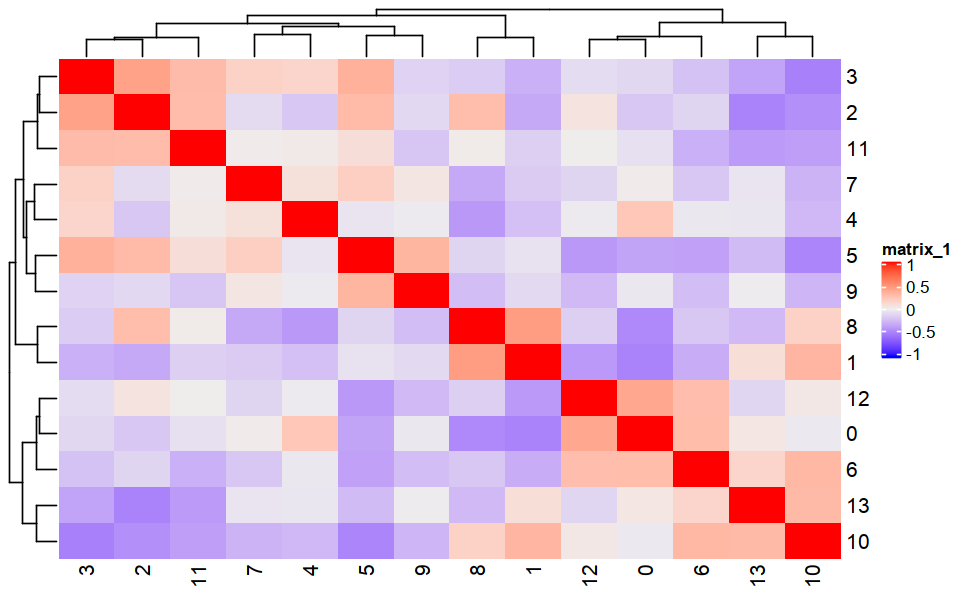

In [278]:
fig.size(5, 8)
Heatmap(cormat)
# Heatmap(pmax(cormat, .2))

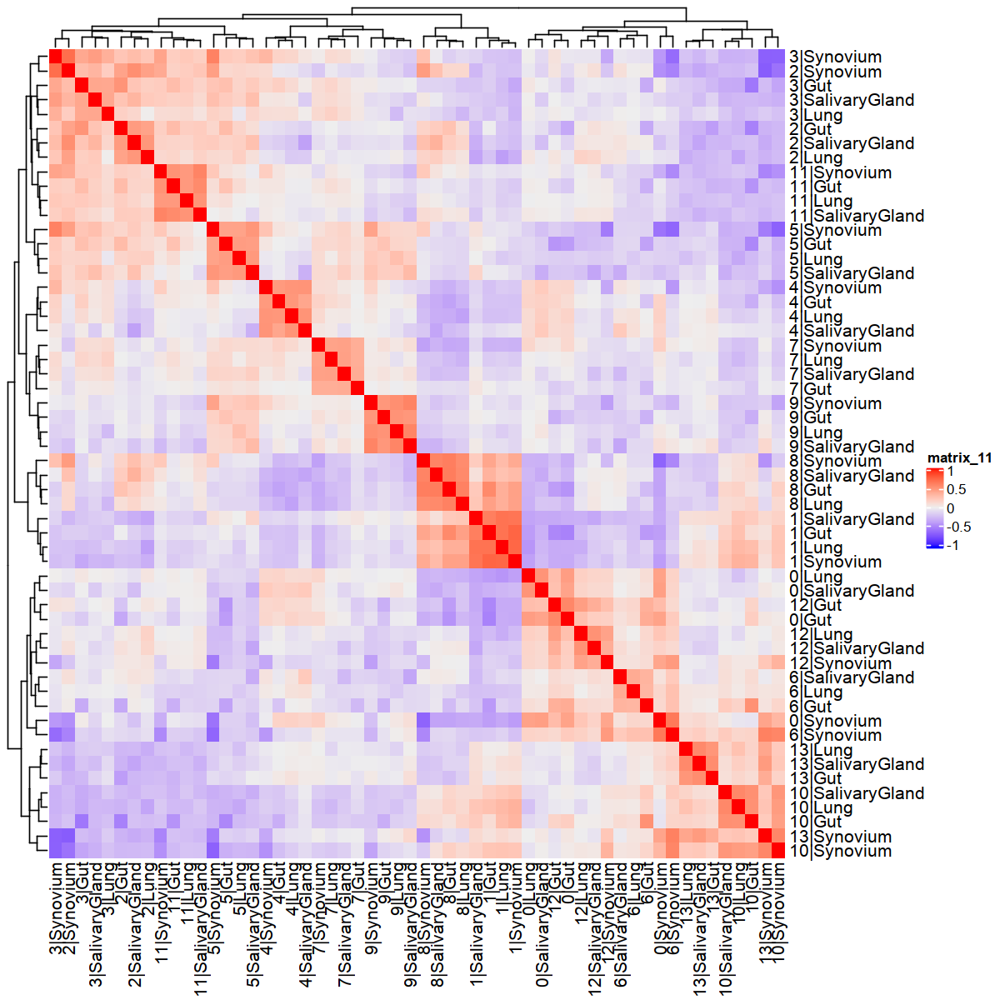

In [293]:
fig.size(10, 10)
effects_nested %>% 
    dplyr::select(zscore, feature, contrast) %>% 
    tidyr::spread(contrast, zscore) %>% 
    tibble::column_to_rownames('feature') %>% 
    cor() %>% 
    Heatmap()


## Nested effects

Cluster:C5-vs-all

$\beta_{C5} - \frac{1}{N-1}\sum_{k\neq C5} \beta_{Ck}$

Cluster:one-vs-all|Tissue

Cluster:C5-vs-all within Lung

$\beta_{C5} - \frac{1}{N-1}\sum_{k\neq C5} \beta_{Ck} + \beta_{C5:Lung} - \frac{1}{N-1}\sum_{k\neq C5} \beta_{Ck:Lung}$





In [83]:
contrasts_mat <- make_contrast.presto(obj$presto, 'Cluster', 'Tissue')
effects_nested <- contrasts.presto(obj$presto, contrasts_mat, one_tailed = TRUE) %>% 
    tidyr::separate(contrast, c('Cluster', 'Tissue'), sep = '\\|', remove = FALSE) %>% 
    arrange(pvalue)


Warning message:
“Expected 2 pieces. Missing pieces filled with `NA` in 14 rows [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14].”


In [ ]:
effects_nested %>% 
    subset(Tissue == 'Synovium') %>% 
    subset(pvalue < .05) %>% 
    arrange(pvalue) %>% 
    head(15)


In [ ]:
effects_nested %>% 
    subset(grepl('TGF', feature)) %>% 
    subset(Cluster == '4') %>% 
    subset(pvalue < .05) %>% 
    arrange(pvalue) %>% 
    head(25)


## Conserved markers

In [221]:
data.table(effects_nested)[
    , sum(pvalue < .1 & beta > 0), by = .(Cluster, feature)
][
    V1 == 4
] %>% 
    inner_join(effects_marginal) %>% 
#     subset(Cluster %in% as.character(2:13)) %>% 
    subset(Cluster == '8') %>% 
    split(.$Cluster) %>% 
#     map(arrange, -beta) %>% 
    map(arrange, pvalue) %>% 
    map(head, 50)
#     map(nrow)


Joining, by = c("Cluster", "feature")



,Cluster,feature,V1,contrast,beta,sigma,zscore,pvalue
,<chr>,<chr>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,8,PTGS2,4,8,1.5341098,0.2910216,5.271464,6.766990e-08
2,8,SEMA4A,4,8,1.5918232,0.3036548,5.242214,7.933077e-08
3,8,CXCL2,4,8,1.6804605,0.3491309,4.813268,7.424113e-07
4,8,ARC,4,8,1.4422806,0.3137491,4.596924,2.143871e-06
5,8,FOSB,4,8,1.0982060,0.2408942,4.558872,2.571450e-06
6,8,IL6,4,8,1.7596926,0.4034950,4.361126,6.469748e-06
7,8,FCGR1B,4,8,1.6994769,0.4090279,4.154917,1.627028e-05
8,8,TULP2,4,8,1.2329823,0.2994242,4.117845,1.912162e-05
9,8,ATF3,4,8,1.1183409,0.2737335,4.085510,2.199010e-05


## Total DGEs

In [366]:
data.table(effects_marginal)[, sum(beta > 0 & pvalue < 1e-6), by = Cluster][order(-V1)]


Cluster,V1
<chr>,<int>
9,19
11,8
13,3
8,3
5,2
4,1
10,0
6,0
3,0


In [234]:
data.table(effects_nested)[
        , sum(pvalue < .1 & beta > 0), by = .(Cluster, feature)
    ][
        V1 >= 4
    ][
        , .N, by = Cluster
    ][order(N)]


Cluster,N
<chr>,<int>
12,13
0,14
1,16
3,17
7,18
6,25
2,25
13,38
10,47


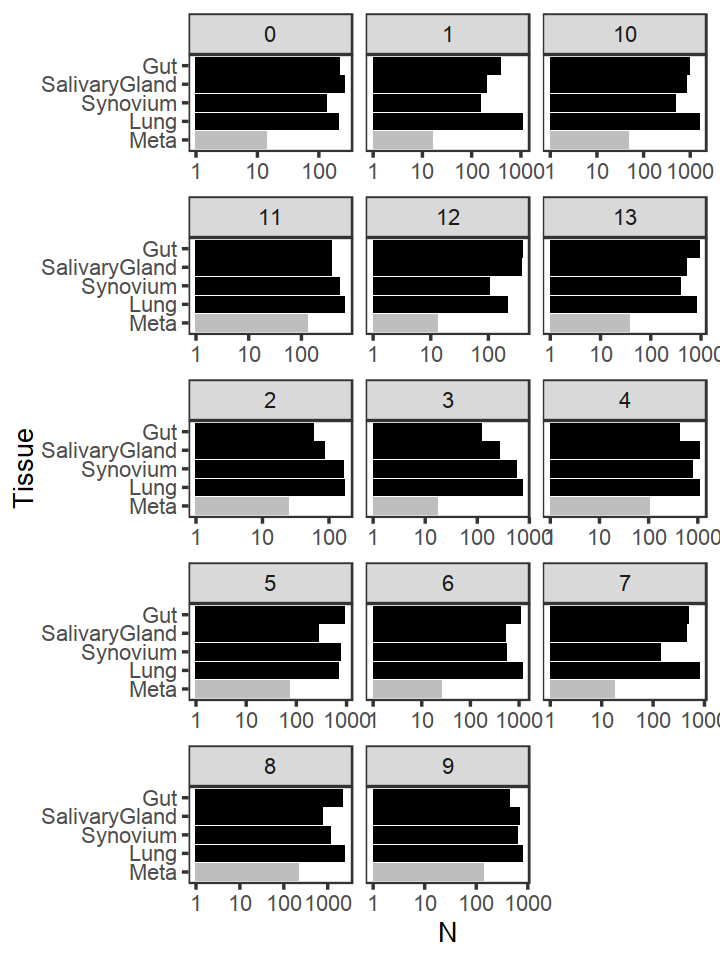

In [230]:
fig.size(8, 6)
data.table(effects_nested)[, .(N = sum(beta > 0 & pvalue < .1)), by = .(Cluster, Tissue)] %>% 
    rbind(
        data.table(effects_nested)[
            , sum(pvalue < .1 & beta > 0), by = .(Cluster, feature)
        ][
            V1 >= 4
        ][
            , .N, by = Cluster
        ][order(N)] %>% 
            dplyr::mutate(Tissue = 'Meta') %>% 
            dplyr::select(Cluster, Tissue, N)
    ) %>% 
    dplyr::mutate(Tissue = factor(Tissue, c('Meta', 'Lung', 'Synovium', 'SalivaryGland', 'Gut'))) %>% 
    ggplot(aes(Tissue, N, fill = Tissue == 'Meta')) + 
        geom_bar(stat = 'identity') + 
        facet_wrap(~Cluster, scales = 'free_x', ncol = 3) + 
        theme_test(base_size = 16) + 
        coord_flip() + 
        scale_fill_manual(values = c('black', 'grey')) + 
        scale_y_log10() + 
        guides(fill = FALSE) + 
        NULL


## Tissue-specific markers

In [461]:
effects_specificity <- contrasts.presto(obj$presto_sig05, contrasts_mat, one_tailed = TRUE) %>% 
    tidyr::separate(contrast, c('Tissue', 'Cluster'), sep = '\\|', remove = FALSE) %>% 
    arrange(pvalue)

In [464]:
X <- inner_join(
    effects_specificity %>% subset(pvalue < .05), 
    effects_nested %>% subset(pvalue < .05), 
    by = c('Cluster', 'Tissue', 'feature'), 
    suffix = c('_diff', '_spec')
)


## Tissue-generic markers 

In [458]:
data.table(effects_nested)[
    , all(pvalue < .05)
    , by = .(Cluster, feature)
][
    V1 == TRUE
][
    , .N, by = Cluster
] %>% 
    arrange(Cluster) %>% 
    kable() %>% 
    kable_styling() %>% 
    as.character() %>% 
    IRdisplay::display_html()



Cluster,N
0,28
1,2
10,3
11,20
2,9
3,9
4,3
5,7
6,75
9,14


In [459]:
effects_specificity <- contrasts.presto(obj$presto_sig05, contrasts_mat, one_tailed = FALSE) %>% 
    tidyr::separate(contrast, c('Tissue', 'Cluster'), sep = '\\|', remove = FALSE) %>% 
    arrange(pvalue)

In [460]:
inner_join(
    ## differential cluster markers
    effects_marginal %>% 
        subset(pvalue < .05),
    ## only keep those that are not significantly lower than 
    data.table(effects_specificity)[
        , all(beta > 0 | pvalue > .1),
        by = .(Cluster, feature)
    ][V1 == TRUE]
) %>% 
    with(table(Cluster)) %>% 
    data.table() %>% 
    arrange(Cluster) %>% 
    kable() %>% 
    kable_styling() %>% 
    as.character() %>% 
    IRdisplay::display_html()


Joining, by = c("feature", "Cluster")



Cluster,N
0,85
1,44
10,74
11,264
2,227
3,105
4,37
5,232
6,191
9,138


In [501]:
# effects_marginal %>% 
effects_nested %>% 
#     subset(feature %in% c('MMP1')) %>% 
#     subset(Cluster == '1') %>% 
    arrange(feature, pvalue) 


contrast,Cluster,Tissue,feature,beta,sigma,zscore,pvalue
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
5|Lung,5,Lung,A1BG,0.707154411,0.4491938,1.574274617,0.05771199
10|Gut,10,Gut,A1BG,0.765794474,0.5976723,1.281294855,0.10004506
11|Synovium,11,Synovium,A1BG,0.638916678,0.5693628,1.122161002,0.13089700
4|SalivaryGland,4,SalivaryGland,A1BG,0.372908533,0.3837564,0.971732422,0.16559184
5|Gut,5,Gut,A1BG,0.382864640,0.4079023,0.938618514,0.17396332
10|Synovium,10,Synovium,A1BG,0.506814534,0.6465319,0.783897239,0.21655020
1|SalivaryGland,1,SalivaryGland,A1BG,0.284421418,0.4549546,0.625164427,0.26593157
4|Gut,4,Gut,A1BG,0.233246733,0.3817462,0.610999447,0.27059997
11|SalivaryGland,11,SalivaryGland,A1BG,0.298551397,0.5827342,0.512328625,0.30421052


## Assign names


In [133]:
head(obj$meta_data)

,CellID,LibraryID,nGene,nUMI,percent_mito,SampleID,Technology,Tissue,DonorID,Case,⋯,scDblFinder.weighted,scDblFinder.ratio,scDblFinder.score,scDblFinder.class,UMAP1_tissue,UMAP2_tissue,weight,Cluster,Name_conserved,Name_overall
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,AAACGCTCAGTTGTCA_GX44,GX44,2335,6313,0.08965626,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,0.10872971,0.10,0.10872971,singlet,0.5644859,0.9192276,2.674873,5,CD34+FBLN1+,CD34+FBLN1+
2,AAACGCTTCCTTATAC_GX44,GX44,3113,11020,0.09301270,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,0.09492730,0.10,0.09492730,singlet,-2.0237623,0.3501552,2.674873,2,JUN+FOS+,JUN+FOS+
3,AAAGGATTCTGCATGA_GX44,GX44,2367,5787,0.14014170,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,0.03550406,0.05,0.03550406,singlet,1.2860459,-1.8311363,2.674873,4,ADAM12+SPARC+,ADAM12+SPARC+
4,AAAGGATTCTTTCCAA_GX44,GX44,1992,5306,0.17433095,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,0.00000000,0.00,0.00000000,singlet,0.4965957,1.1071272,2.674873,1,FN1+,COL6A6+
5,AAAGGGCAGAGTGTTA_GX44,GX44,2417,7568,0.07478858,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,0.00000000,0.00,0.00000000,singlet,1.7427544,1.3099361,2.674873,5,CD34+FBLN1+,CD34+FBLN1+
6,AAAGGGCCATTGAGCT_GX44,GX44,1958,3356,0.09266985,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,0.00000000,0.00,0.00000000,singlet,1.3307821,-1.7030562,2.674873,1,FN1+,COL6A6+


In [135]:
obj$meta_data <- obj$meta_data %>% 
    dplyr::select(-Cluster_name) %>% 
    left_join(
        tribble(
            ~Cluster, ~Cluster_name, 
            ## Inflammatory markers 
            '4', 'SPARC+COL3A1+ C4', 
            '8', 'PTGS2+SEMA4A+ C8', 
            '11', 'CXCL10+CCL19+ C11', 

            ## Boundary 
            '0', 'C0',
            '1', 'C1',
            '2', 'C2', 
            '3', 'C3', 
            '6', 'C6', 
            '7', 'C7', 
            '10', 'C10', 
            '12', 'C12', 

            ## Other
            '5', 'FBLN1+ C5',
            '9', 'CD34+MFAP5+ C9',
            '13', 'MYH11+ C13'
        ),
        by = 'Cluster'
    )



In [20]:
head(obj$meta_data)

,CellID,LibraryID,nGene,nUMI,percent_mito,SampleID,Technology,Tissue,DonorID,Case,⋯,scDblFinder.weighted,scDblFinder.ratio,scDblFinder.score,scDblFinder.class,UMAP1_tissue,UMAP2_tissue,weight,Cluster,Name_conserved,Name_overall
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,AAACGCTCAGTTGTCA_GX44,GX44,2335,6313,0.08965626,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,0.10872971,0.10,0.10872971,singlet,0.5644859,0.9192276,2.674873,5,CD34+FBLN1+,CD34+FBLN1+
2,AAACGCTTCCTTATAC_GX44,GX44,3113,11020,0.09301270,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,0.09492730,0.10,0.09492730,singlet,-2.0237623,0.3501552,2.674873,2,JUN+FOS+,JUN+FOS+
3,AAAGGATTCTGCATGA_GX44,GX44,2367,5787,0.14014170,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,0.03550406,0.05,0.03550406,singlet,1.2860459,-1.8311363,2.674873,4,ADAM12+SPARC+,ADAM12+SPARC+
4,AAAGGATTCTTTCCAA_GX44,GX44,1992,5306,0.17433095,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,0.00000000,0.00,0.00000000,singlet,0.4965957,1.1071272,2.674873,1,FN1+,COL6A6+
5,AAAGGGCAGAGTGTTA_GX44,GX44,2417,7568,0.07478858,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,0.00000000,0.00,0.00000000,singlet,1.7427544,1.3099361,2.674873,5,CD34+FBLN1+,CD34+FBLN1+
6,AAAGGGCCATTGAGCT_GX44,GX44,1958,3356,0.09266985,GX44,10XV3,SalivaryGland,GX44,SICCA,⋯,0.00000000,0.00,0.00000000,singlet,1.3307821,-1.7030562,2.674873,1,FN1+,COL6A6+


## Conserved markers 

Test nested vs marginal effects 

In [36]:
effects_marginal %>% 
    subset(feature == 'ADAM12') %>% 
    subset(pvalue < .05) %>% 
    arrange(pvalue)


contrast,feature,beta,sigma,zscore,pvalue,Cluster
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
4,ADAM12,1.643302,0.2890317,5.685543,6.519875e-09,4


In [40]:
effects_nested %>% 
    subset(feature == 'ADAM12') %>% 
    subset(Cluster == '4') %>% 
#     subset(Tissue == 'Synovium') %>% 
    arrange(pvalue)


contrast,Cluster,Tissue,feature,beta,sigma,zscore,pvalue
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
4|Lung,4,Lung,ADAM12,2.224707,0.3378174,6.585529,2.266344e-11
4|SalivaryGland,4,SalivaryGland,ADAM12,2.073731,0.3355812,6.179519,3.214861e-10
4|Gut,4,Gut,ADAM12,1.692062,0.3273276,5.169323,1.174716e-07
4|Synovium,4,Synovium,ADAM12,1.577919,0.3290096,4.795966,8.094630e-07


In [41]:
effects_joint <- inner_join(
    dplyr::select(effects_marginal, Cluster, feature, beta, sigma, pvalue),
    dplyr::select(effects_nested, Cluster, Tissue, feature, beta, sigma, pvalue), 
    by = c('Cluster', 'feature'), 
    suffix = c('_marginal', '_nested')
) %>% 
    dplyr::mutate(zscore = (beta_marginal - beta_nested) / sqrt(sigma_marginal^2 + sigma_nested^2)) %>% 
    dplyr::mutate(pvalue = 2 * pnorm(-abs(zscore))) %>% 
    identity()


In [43]:
head(effects_joint)

Cluster,feature,beta_marginal,sigma_marginal,pvalue_marginal,Tissue,beta_nested,sigma_nested,pvalue_nested,zscore,pvalue
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
11,CCL19,4.866968,0.6387375,1.271637e-14,Gut,5.208766,0.7175524,1.948743e-13,-0.3557949,0.721994173
11,CCL19,4.866968,0.6387375,1.271637e-14,Synovium,5.085097,0.7209392,8.727806e-13,-0.2264646,0.820840106
11,CCL19,4.866968,0.6387375,1.271637e-14,SalivaryGland,5.164134,0.7368079,1.201919e-12,-0.3047457,0.760559805
11,CCL19,4.866968,0.6387375,1.271637e-14,Lung,4.515714,0.7196669,1.751232e-10,0.3650378,0.715083189
9,PCOLCE2,2.606899,0.3801777,3.514730e-12,SalivaryGland,4.163958,0.4628805,1.173106e-19,-2.5994572,0.009337131
9,PCOLCE2,2.606899,0.3801777,3.514730e-12,Lung,3.464794,0.5122175,6.697621e-12,-1.3448979,0.178658210


In [44]:
effects_joint %>% 
    subset(feature == 'CD34') %>% 
    subset(Cluster == '5')


Cluster,feature,beta_marginal,sigma_marginal,pvalue_marginal,Tissue,beta_nested,sigma_nested,pvalue_nested,zscore,pvalue
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
5,CD34,0.8878332,0.2619187,0.0003498104,Gut,1.4508955,0.3296072,5.365543e-06,-1.3374351,0.1810807
5,CD34,0.8878332,0.2619187,0.0003498104,Synovium,1.4634185,0.3378274,7.393006e-06,-1.3464996,0.1781415
5,CD34,0.8878332,0.2619187,0.0003498104,Lung,0.9810204,0.3424484,2.086858e-03,-0.2161468,0.8288733
5,CD34,0.8878332,0.2619187,0.0003498104,SalivaryGland,0.3224713,0.3431664,1.736874e-01,1.3096185,0.1903249


In [45]:
markers_conserved_df <- inner_join(
    ## filter out genes with heterogeneous effects (from mean effect)
    data.table(effects_joint)[
        , all(pvalue > .05 & pvalue_marginal < .05), by = .(feature, Cluster)
    ][V1 == TRUE][, V1 := NULL][],

    ## conserved genes must individually be significantly > 0
    data.table(effects_nested)[
        , all(pvalue < .05 & beta > 0), by = .(feature, Cluster)
    ][V1 == TRUE][, V1 := NULL][]
)


Joining, by = c("feature", "Cluster")



Warning message:
“Ignoring unknown parameters: shape”
`geom_smooth()` using formula 'y ~ x'



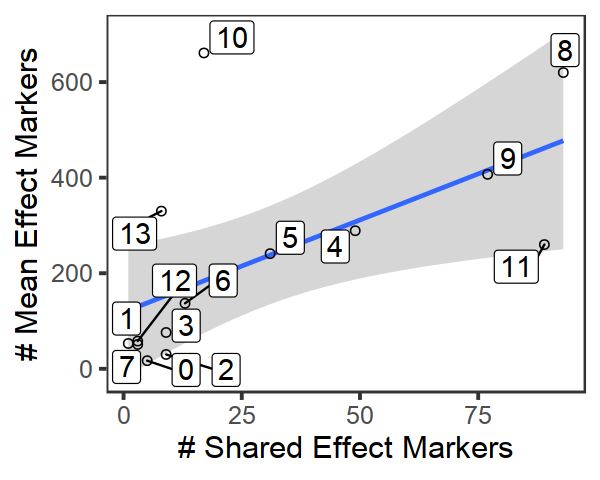

In [175]:
fig.size(4, 5)
inner_join(
    markers_conserved_df[, .N, by = Cluster][order(-N)],
    data.table(effects_marginal)[, .(N = sum(beta > 0 & pvalue < .05)), by = Cluster],
    by = 'Cluster', 
    suffix = c('_common', '_mean')
) %>% 
    ggplot(aes(N_common, N_mean)) + 
        geom_smooth(method = 'lm') + 
        geom_point(shape = 21, size = 2) + 
        geom_label_repel(shape = 21, aes(label = Cluster), size = 6) + 
        theme_test(base_size = 18) + 
        labs(x = '# Shared Effect Markers', y = '# Mean Effect Markers') + 
#         scale_x_log10() + scale_y_log10() + 
        NULL


In [48]:
markers_conserved_df %>% 
    left_join(effects_marginal) %>% 
    subset(Cluster %in% c('4', '11')) %>% 
    split(.$Cluster) %>% 
    map(arrange, pvalue) %>% 
    map(head, 30)


Joining, by = c("feature", "Cluster")



,feature,Cluster,contrast,beta,sigma,zscore,pvalue
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,CCL19,11,11,4.8669680,0.6387375,7.619669,1.271637e-14
2,CXCL10,11,11,4.5359243,0.6722624,6.747252,7.533556e-12
3,RBP5,11,11,1.9327509,0.3449129,5.603591,1.049779e-08
4,HLA-DRA,11,11,1.5142711,0.2776734,5.453425,2.470439e-08
5,CD74,11,11,1.3519651,0.2572648,5.255150,7.395191e-08
6,HLA-DRB1,11,11,1.3728398,0.2742439,5.005909,2.779952e-07
7,IL32,11,11,1.2251202,0.2453140,4.994089,2.955706e-07
8,IRF8,11,11,1.7286919,0.3586678,4.819758,7.186618e-07
9,OASL,11,11,1.6922477,0.3575686,4.732652,1.108029e-06


## Non-conserved markers

Markers that are genes in >=1 tissues but not conserved. 


In [173]:
effects_nested %>% 
    subset(pvalue < .05 & beta > 0) %>% 
    subset(!feature %in% markers_conserved_df$feature) %>% 
    with(table(Cluster, Tissue)) 


       Tissue
Cluster  Gut Lung SalivaryGland Synovium
     0    71   42            85       43
     1    71  231            24        6
     10  374  789           309      134
     11  120  203           114      208
     12  188   58           125       25
     13  452  352           191      128
     2     9   46             8       41
     3    33  295            85      321
     4   151  465           570      430
     5   470  297            85      417
     6   588  484           194      281
     7   171  302           156       47
     8  1031 1333           227      352
     9   147  324           353      332

## Cache effects


In [5]:
contrasts_mat <- make_contrast.presto(obj$presto, 'Cluster')
obj$effects_marginal <- contrasts.presto(obj$presto, contrasts_mat, one_tailed = TRUE) %>% 
    dplyr::mutate(Cluster = contrast) %>% 
    arrange(pvalue)

contrasts_mat <- make_contrast.presto(obj$presto, 'Cluster', 'Tissue')
obj$effects_nested <- contrasts.presto(obj$presto, contrasts_mat, one_tailed = TRUE) %>% 
    tidyr::separate(contrast, c('Cluster', 'Tissue'), sep = '\\|', remove = FALSE) %>% 
    arrange(pvalue)



Warning message:
“Expected 2 pieces. Missing pieces filled with `NA` in 14 rows [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14].”


# Pathways

In [40]:
future::plan(multiprocess)

do_fgsea <- function(effects, genesets_db, .minSize=10, .nperm=1e3, .nproc=1, verbose=FALSE) {
#     fgsea_res <- expand.grid(
#         cluster_test = unique(effects$Cluster), 
#         db_test = names(genesets_db),
#         stringsAsFactors = FALSE
#     ) %>% 
    fgsea_res <- unique(effects$Cluster) %>% 
        future_map(function(cluster_test) {
            
#         })
#     future_pmap(function(cluster_test, db_test, ...) {
        if (verbose) {
            message(cluster_test)
#             message(sprintf('%:%s', cluster_test, db_test))
        }
            
        .SD <- effects %>% 
            subset(Cluster == cluster_test)
        stats_vec <- .SD$zscore
#         stats_vec <- .SD$beta
        names(stats_vec) <- .SD$feature
        stats_vec <- stats_vec[!is.na(stats_vec)]
        
        suppressWarnings({
            fgsea::fgsea(
                pathways = genesets_db,
#                 pathways = genesets_db[[db_test]],
                stats = stats_vec,
                nperm = .nperm,
                minSize = .minSize,
                nproc = .nproc
            ) %>% 
                dplyr::mutate(
                    Cluster = cluster_test
#                     DB = db_test
                ) %>% 
                dplyr::select(Cluster, everything())            
#                 dplyr::select(Cluster, DB, everything())            
        })
    }) %>% 
        bind_rows()

}

## Genesets


In [41]:
genesets_frc <- readRDS('/data/srlab2/ik936/Roche/data/cache/genesets.rds')
genesets_frc <- list(
    frc=genesets_frc[setdiff(names(genesets_frc), c('TGFb', 'TNF', 'Notch', 'WNT'))],
    stim=genesets_frc[c('TGFb', 'TNF', 'Notch', 'WNT')]
)

genesets_frc <- genesets_frc %>% 
    imap(function(.SD, name) {
        names(.SD) <- paste(name, names(.SD), sep = ':')
        return(.SD)
    }) %>% 
    purrr::reduce(c)


In [43]:
library(msigdbr)
gs_use <- c('H', 'C2', 'C5')
X <- map(gs_use, msigdbr::msigdbr, species = "Homo sapiens")

genesets_msig <- map2(X, gs_use, function(.SD, name) {
    .SD %>% 
        subset(human_gene_symbol %in% obj$effects_marginal$feature) %>% 
        split(.$gs_name) %>% 
        map('human_gene_symbol')        
})

names(genesets_msig) <- gs_use

genesets_msig <- genesets_msig %>% 
    imap(function(.SD, name) {
        names(.SD) <- paste(name, names(.SD), sep = ':')
        return(.SD)
    }) %>% 
    purrr::reduce(c)


In [44]:
genesets_enrichr <- readRDS('/data/srlab2/ik936/Roche/data/pathways/db.rds')
db_use <- names(genesets_enrichr) %>% setdiff(c('LINCS_L1000_Chem_Pert_down', 'LINCS_L1000_Chem_Pert_up'))
genesets_enrichr <- genesets_enrichr[db_use]

genesets_enrichr <- genesets_enrichr %>% 
    imap(function(.SD, name) {
        names(.SD) <- paste(name, names(.SD), sep = ':')
        return(.SD)
    }) %>% 
    purrr::reduce(c)


In [45]:
genesets <- Reduce(c, list(genesets_msig, genesets_enrichr, genesets_frc))

In [46]:
names(genesets) %>% strsplit(split = ':') %>% map(1) %>% unique

[[1]]
[1] "H"

[[2]]
[1] "C2"

[[3]]
[1] "C5"

[[4]]
[1] "BioPlanet_2019"

[[5]]
[1] "GO_Biological_Process_2018"

[[6]]
[1] "GO_Cellular_Component_2018"

[[7]]
[1] "GO_Molecular_Function_2018"

[[8]]
[1] "KEGG_2019_Human"

[[9]]
[1] "KEGG_2019_Mouse"

[[10]]
[1] "Ligand_Perturbations_from_GEO_down"

[[11]]
[1] "Ligand_Perturbations_from_GEO_up"

[[12]]
[1] "LINCS_L1000_Ligand_Perturbations_down"

[[13]]
[1] "LINCS_L1000_Ligand_Perturbations_up"

[[14]]
[1] "MGI_Mammalian_Phenotype_Level_4_2019"

[[15]]
[1] "TF_Perturbations_Followed_by_Expression"

[[16]]
[1] "TRRUST_Transcription_Factors_2019"

[[17]]
[1] "WikiPathways_2019_Human"

[[18]]
[1] "WikiPathways_2019_Mouse"

[[19]]
[1] "frc"

[[20]]
[1] "stim"

In [47]:
head(names(genesets))

[1] "H:HALLMARK_ADIPOGENESIS"        "H:HALLMARK_ALLOGRAFT_REJECTION"
[3] "H:HALLMARK_ANDROGEN_RESPONSE"   "H:HALLMARK_ANGIOGENESIS"       
[5] "H:HALLMARK_APICAL_JUNCTION"     "H:HALLMARK_APICAL_SURFACE"

## Marginal enrichment

In [48]:
# contrasts_mat <- make_contrast.presto(obj$presto, 'Cluster')
# effects_marginal <- contrasts.presto(obj$presto, contrasts_mat, one_tailed = TRUE) %>% 
#     dplyr::mutate(Cluster = contrast) %>% 
#     arrange(pvalue)
effects_marginal <- obj$effects_marginal

In [49]:
t_gsea <- system.time({
#     obj$gsea <- do_fgsea(effects_marginal, genesets_frc, .minSize=10, .nperm=1e4, .nproc=10) %>% 
    obj$gsea <- do_fgsea(effects_marginal, genesets, .minSize=10, .nperm=1e4, .nproc=10) %>% 
        dplyr::mutate(
            database = gsub('(.*?):(.*)', '\\1', pathway),
            pathway = gsub('(.*?):(.*)', '\\2', pathway)
        ) %>% 
        dplyr::select(Cluster, database, pathway, everything())
})


In [50]:
## ~?? minutes
t_gsea
t_gsea[['elapsed']] / 60

    user   system  elapsed 
 637.278 1413.524  139.202 

[1] 2.320033

In [51]:
length(unique(obj$gsea$pathway))
nrow(obj$gsea)

[1] 22364

[1] 324170

Warning message:
“The input is a data frame, convert it to the matrix.”


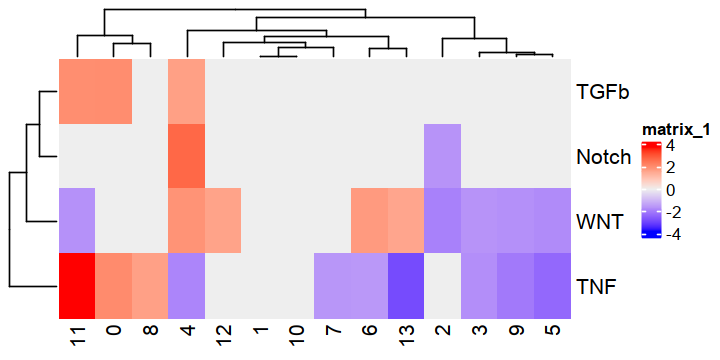

In [52]:
fig.size(3, 6)
obj$gsea %>% 
    subset(database == 'stim') %>% 
    dplyr::mutate(score = NES) %>% 
    dplyr::mutate(score = case_when(
        padj < .05 ~ score,
        TRUE ~ 0
    )) %>% 
    dplyr::select(score, Cluster, pathway) %>% 
    tidyr::spread(Cluster, score, fill = 0) %>% 
    tibble::column_to_rownames('pathway') %>% 
    Heatmap()


Warning message:
“The input is a data frame, convert it to the matrix.”


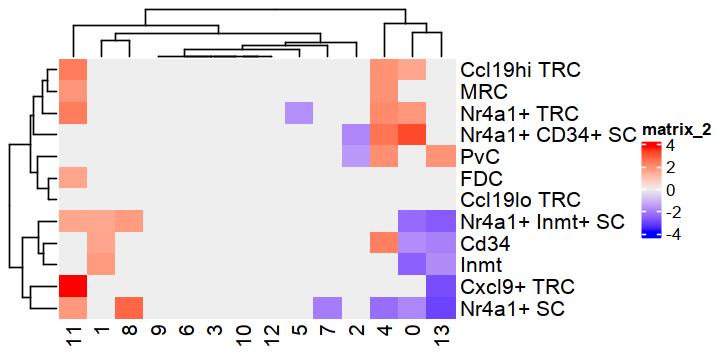

In [53]:
fig.size(3, 6)
obj$gsea %>% 
    subset(database == 'frc') %>% 
#     dplyr::mutate(score = sign(ES) * -log10(pval)) %>% 
    dplyr::mutate(score = NES) %>% 
#     subset(padj < 0.05) %>% 
    dplyr::mutate(score = case_when(
        padj < .01 ~ score,
        TRUE ~ 0
    )) %>% 
    dplyr::select(score, Cluster, pathway) %>% 
    tidyr::spread(Cluster, score, fill = 0) %>% 
    tibble::column_to_rownames('pathway') %>% 
    Heatmap()


In [54]:
obj$gsea %>% 
#     subset(padj < .05 & NES > 0) %>% 
    subset(ES > 0) %>% 
    arrange(padj) %>% 
    subset(database == 'stim') %>% 
    select(-leadingEdge) %>% 
    split(.$pathway) %>% 
    map(arrange, padj) %>% 
    map(head)

# %>% 

#     head


,Cluster,database,pathway,pval,padj,ES,NES,nMoreExtreme,size
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,4,stim,Notch,0.0001529988,0.004080199,0.6455723,2.5921196,0,110
2,13,stim,Notch,0.1652880355,0.367017854,0.2923173,1.1883686,1118,110
3,11,stim,Notch,0.2735300020,0.569720896,0.2756377,1.1041991,1362,110
4,0,stim,Notch,0.5446728972,0.733923260,0.2065632,0.9669765,1456,110
5,1,stim,Notch,0.6223818679,0.824543759,0.2359933,0.9416078,6150,110
,Cluster,database,pathway,pval,padj,ES,NES,nMoreExtreme,size
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,11,stim,TGFb,0.0002015316,0.00294449,0.5002061,1.928627,0,87
2,0,stim,TGFb,0.0003494060,0.00626504,0.4354601,1.951038,0,87


In [55]:
obj$gsea %>% 
#     subset(Cluster == '4') %>% 
    select(-leadingEdge) %>% 
    subset(database %in% c('GO_Biological_Process_2018', 'GO_Molecular_Function_2018')) %>% 
#     subset(NES > 0 & padj < .05 & !grepl('^negative regulation', pathway)) %>% 
#     subset(grepl('tumor necro', pathway, ignore.case = TRUE)) %>% 
#     subset(grepl('il1b|interleukin.?1', pathway, ignore.case = TRUE)) %>% 
#     subset(grepl('tgf|transforming growth', pathway, ignore.case = TRUE)) %>% 
    subset(grepl('Notch signaling pathway', pathway, ignore.case = TRUE)) %>% 
    arrange(-NES)
#     arrange(padj)


Cluster,database,pathway,pval,padj,ES,NES,nMoreExtreme,size
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
2,GO_Biological_Process_2018,Notch signaling pathway (GO:0007219),0.0012515645,0.02206074,0.4515945,1.8693707,1,50
11,GO_Biological_Process_2018,Notch signaling pathway (GO:0007219),0.0036870135,0.02924728,0.4868368,1.6919271,17,50
12,GO_Biological_Process_2018,positive regulation of Notch signaling pathway (GO:0045747),0.0196253345,0.09721836,0.4273267,1.5837076,43,30
8,GO_Biological_Process_2018,negative regulation of Notch signaling pathway (GO:0045746),0.0228926823,0.09833515,0.5093746,1.5667253,172,25
4,GO_Biological_Process_2018,Notch signaling pathway (GO:0007219),0.0321032600,0.15136448,0.4265099,1.4885425,193,50
8,GO_Biological_Process_2018,regulation of Notch signaling pathway (GO:0008593),0.0603631219,0.18871437,0.3756571,1.3791110,511,62
10,GO_Biological_Process_2018,negative regulation of Notch signaling pathway (GO:0045746),0.1042518904,0.35821262,0.4459205,1.3350474,840,25
2,GO_Biological_Process_2018,negative regulation of Notch signaling pathway (GO:0045746),0.1230486685,0.29663244,0.3752608,1.2988425,267,25
4,GO_Biological_Process_2018,regulation of Notch signaling pathway (GO:0008593),0.1098294070,0.32976603,0.3547418,1.2898668,675,62


## C4 morphogens

## Nested enrichment

In [18]:
t_enrich_nested <- system.time({
    obj$gsea_nested <- effects_nested %>% 
    #     subset(Tissue == 'Lung') %>% 
        split(.$Tissue) %>% 
        imap(function(effects_tissue, tissue_test) {
            message(tissue_test)
            effects_tissue %>% 
    #             subset(Cluster %in% c('7')) %>% 
                do_fgsea(genesets, .minSize=10, .nperm=1e4, .nproc=10) %>% 
                dplyr::mutate(
                    database = gsub('(.*?):(.*)', '\\1', pathway),
                    pathway = gsub('(.*?):(.*)', '\\2', pathway)
                )
        }) %>% 
        bind_rows(.id = 'Tissue') %>% 
        dplyr::select(Cluster, Tissue, database, pathway, everything())
    
})


Gut

Lung

SalivaryGland

Synovium



In [79]:
nrow(obj$gsea_nested)

[1] 1212848

In [127]:
rowAnn <- data.frame(
    Cluster = rownames(X) %>% str_split('_') %>% map_chr(1)
)


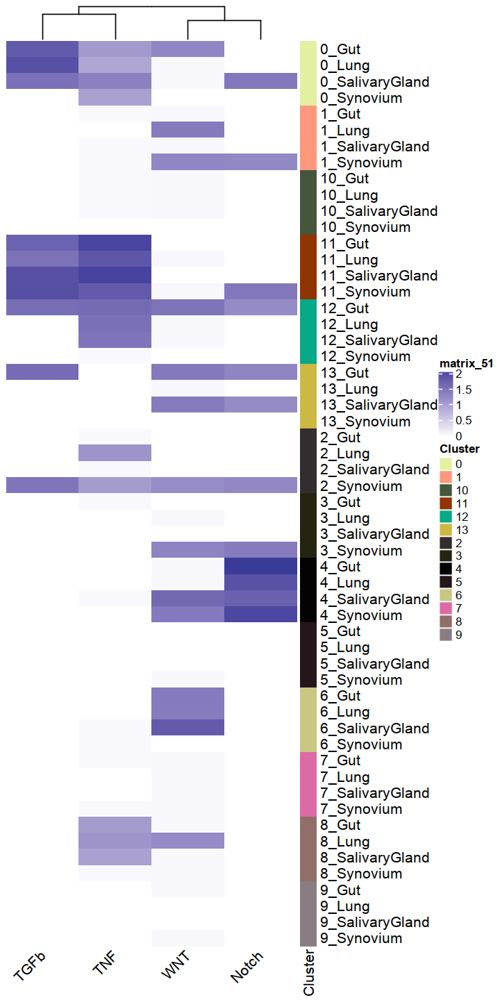

In [142]:
X <- obj$gsea_nested %>% 
    subset(database %in% c('stim')) %>% 
#     subset(database %in% c('frc', 'stim')) %>% 
    dplyr::mutate(score = NES) %>% 
    dplyr::mutate(score = case_when(
        padj < .05 ~ score,
        TRUE ~ 0
    )) %>% 
    dplyr::select(score, Cluster, Tissue, pathway) %>%
    tidyr::unite(Cluster, c('Cluster', 'Tissue')) %>% 
    tidyr::spread(Cluster, score, fill = 0) %>% 
    tibble::column_to_rownames('pathway') %>% 
    t() %>%
    scale

fig.size(12, 6)
Heatmap(
    X, 
    col = colorRamp2(c(0, 0, max(max(X))), c("white", "white", muted("blue"))),
    column_names_rot = 45,
    right_annotation = HeatmapAnnotation(
        df = rowAnn,
        which = 'row'
    ),   
    cluster_rows = FALSE
)


## Topn

In [ ]:
# pathways <- obj$gsea %>% 
#     select(-leadingEdge) %>% 
# #     subset(!database %in% c('C2', 'C7', 'TF_Perturbations_Followed_by_Expression', 'Ligand_Perturbations_from_GEO_down')) %>% 
#     subset(database %in% c('GO_Biological_Process_2018')) %>% 
#     subset(!grepl('negative', pathway)) %>% 
# #     subset(database %in% c('H')) %>% 
#     subset(Cluster %in% c('5', '9', '11', '4', '8')) %>% 
#     subset(grepl('angio', pathway, ignore.case = TRUE)) %>% 
# #     subset(grepl('membrane', pathway, ignore.case = TRUE)) %>% 
#     subset(pval < .01 & NES > 0) %>% 
#     split(.$Cluster) %>% 
#     map(arrange, -NES) %>% 
#     map(head, 20) %>% 
#     map('pathway') %>% 
#     reduce(union)
# #     with(length(unique(pathway)))


In [222]:
# fig.size(10, 6)
# obj$gsea %>% 
#     subset(Cluster %in% c('5', '9', '11', '4', '8')) %>% 
#     subset(pathway %in% pathways) %>% 
# #     subset(database == 'LINCS_L1000_Ligand_Perturbations_up') %>% 
# #     subset(database == 'H') %>% 
#     dplyr::select(Cluster, pathway, NES) %>% 
#     tidyr::spread(Cluster, NES) %>% 
#     tibble::column_to_rownames('pathway') %>% 
#     as.matrix() %>% 
# #     t %>% scale %>% t %>% 
#     Heatmap()


In [9]:
obj$gsea %>% 
    select(-leadingEdge) %>%
    subset(database %in% c('H')) %>% 
    subset(grepl('IL\\d', pathway)) %>% 
    select(pathway, size) %>% unique()


pathway,size
<chr>,<int>
HALLMARK_IL2_STAT5_SIGNALING,182
HALLMARK_IL6_JAK_STAT3_SIGNALING,74


In [5]:
obj$gsea %>% 
    select(-leadingEdge) %>%
#     subset(!database %in% c('C2', 'C7', 'TF_Perturbations_Followed_by_Expression', 'Ligand_Perturbations_from_GEO_down')) %>% 
#     subset(grepl('^GO', database)) %>% 
#     subset(database %in% c('GO_Molecular_Function_2018', 'GO_Biological_Process_2018')) %>% 
    subset(database %in% c('H')) %>% 
    subset(Cluster %in% c('4', '11')) %>% 
#     subset(Cluster %in% c('5', '9', '11', '4', '8')) %>% 
#     subset(grepl('binding|activity|response|receptor', pathway, ignore.case = TRUE)) %>% 
    subset(!grepl('cancer|onco|carcino', pathway, ignore.case = TRUE)) %>% 
    subset(pval < .05 & NES > 0) %>% 
    split(.$Cluster) %>% 
    map(arrange, -NES) %>% 
    map(head, 30)


,Cluster,database,pathway,pval,padj,ES,NES,nMoreExtreme,size
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,11,H,HALLMARK_INTERFERON_GAMMA_RESPONSE,0.0001955034,0.002443438,0.8465908,3.683851,0,185
2,11,H,HALLMARK_INTERFERON_ALPHA_RESPONSE,0.0002017756,0.002443438,0.8739001,3.428664,0,94
3,11,H,HALLMARK_ALLOGRAFT_REJECTION,0.0001988467,0.002443438,0.6968605,2.963279,0,157
4,11,H,HALLMARK_TNFA_SIGNALING_VIA_NFKB,0.0001957713,0.002443438,0.6613321,2.888391,0,192
5,11,H,HALLMARK_INFLAMMATORY_RESPONSE,0.0001965409,0.002443438,0.5988583,2.578739,0,171
6,11,H,HALLMARK_IL6_JAK_STAT3_SIGNALING,0.0002026342,0.002443438,0.6718748,2.531749,0,74
7,11,H,HALLMARK_COMPLEMENT,0.0001952744,0.002443438,0.5435693,2.329367,0,164
8,11,H,HALLMARK_IL2_STAT5_SIGNALING,0.0001953125,0.002443438,0.4788623,2.079862,0,182
9,11,H,HALLMARK_KRAS_SIGNALING_UP,0.0001966568,0.002443438,0.4381476,1.888398,0,173


In [6]:
# obj$gsea %>% 
#     select(-leadingEdge) %>% 
#     subset(padj < .05 & NES > 0) %>% 
#     subset(grepl('notch|tgf|^transforming growth|hedgehog|sonic|^shh|wnt', pathway, ignore.case = TRUE)) %>% 
#     subset(!grepl('notch4', pathway, ignore.case = TRUE)) %>% 
#     subset(!grepl('cancer', pathway, ignore.case = TRUE)) %>% 
#     subset(Cluster == '4') %>% 
#     subset(!database %in% c('C7')) %>% 
#     subset(database %in% c('C2', 'H', 'C5')) %>% 
# #     subset(grepl('hedgehog|sonic|shh', pathway, ignore.case = TRUE)) %>% 
# #     subset(grepl('GEO', database, ignore.case = TRUE)) %>% 
# #     subset(pathway == 'transforming growth factor beta binding (GO:0050431)') %>% 
# #     subset(pathway == 'transforming growth factor beta binding (GO:0050431)') %>% 
#     arrange(padj)


In [166]:
obj$gsea %>% 
    subset(grepl('regulation of B cell activation', pathway)) %>% 
    select(-leadingEdge) %>% 
    arrange(-NES) %>% 
    subset(padj < .05 & NES > 0)


Cluster,database,pathway,pval,padj,ES,NES,nMoreExtreme,size
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
11,GO_Biological_Process_2018,positive regulation of B cell activation (GO:0050871),0.0004216740,0.004315981,0.6748248,2.138167,1,33
8,GO_Biological_Process_2018,regulation of B cell activation (GO:0050864),0.0002824859,0.007548650,0.7442830,1.986308,1,14
2,GO_Biological_Process_2018,regulation of B cell activation (GO:0050864),0.0030698388,0.026945437,0.6398717,1.905259,7,14
8,GO_Biological_Process_2018,positive regulation of B cell activation (GO:0050871),0.0029117610,0.026054182,0.5314826,1.727362,22,33


## Hallmarks

In [58]:
X <- obj$gsea %>% 
    subset(database == 'H') %>% 
    dplyr::select(-leadingEdge) %>% 
#     subset(padj < 0.1) %>% 
#     subset(NES > 0 & padj < 0.1) %>% 
    dplyr::mutate(pathway = gsub('HALLMARK_', '', pathway)) %>% 
    select(Cluster, NES, pathway) %>% 
    tidyr::spread(Cluster, NES, fill = 0) %>% 
    tibble::column_to_rownames('pathway') %>% 
    as('matrix')


In [59]:
p_use <- obj$gsea %>% 
    subset(database == 'H') %>% 
    dplyr::select(-leadingEdge) %>% 
    subset(Cluster %in% c('4', '11')) %>% 
    dplyr::mutate(pathway = gsub('HALLMARK_', '', pathway)) %>% 
    subset(NES > 0 & padj < 0.1) %>% 
    with(unique(pathway))


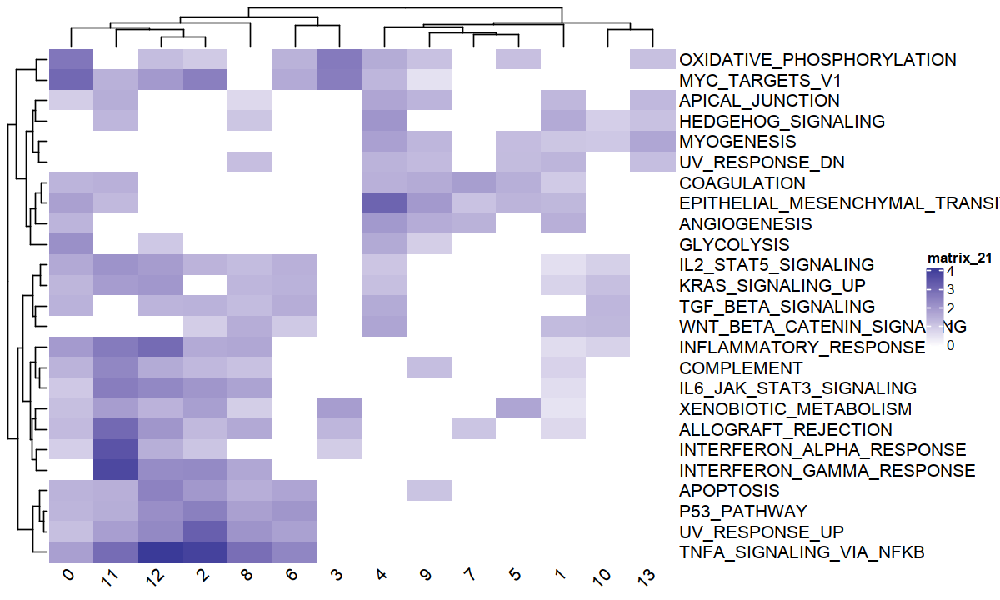

In [68]:
fig.size(6, 10)
Heatmap(
    X[p_use, ],
#     col = colorRamp2(c(min(X), 0, max(X)), c(muted("blue"), "white", muted("red"))),
#     col = colorRamp2(c(min(X), 0, max(X)), c(muted("red"), "white", muted("blue"))),
    col = colorRamp2(c(0, 0, max(X)), c("white", "white", muted("blue"))),
    column_names_rot = 45,
#     show_heatmap_legend = FALSE,
)

In [22]:
obj$gsea %>% 
    subset(database %in% c('H')) %>% 
    dplyr::select(-leadingEdge) %>%
    dplyr::mutate(p = pnorm(-abs(NES))) %>% 
    head()


Cluster,database,pathway,pval,padj,ES,NES,nMoreExtreme,size,p
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
11,H,HALLMARK_ADIPOGENESIS,0.3114626050,0.576741170,0.2420535,1.059945,1594,194,0.144584917
11,H,HALLMARK_ALLOGRAFT_REJECTION,0.0001988467,0.002443438,0.6968605,2.963279,0,157,0.001521901
11,H,HALLMARK_ANDROGEN_RESPONSE,0.4071832123,0.662246153,0.2612113,1.024838,2017,94,0.152719867
11,H,HALLMARK_ANGIOGENESIS,0.0625704622,0.217340518,-0.4519360,-1.416990,332,28,0.078242976
11,H,HALLMARK_APICAL_JUNCTION,0.0023492561,0.017995991,0.3587131,1.546378,11,172,0.061006634
11,H,HALLMARK_APICAL_SURFACE,0.3305907173,0.594842237,0.3382852,1.092489,1566,35,0.137309026


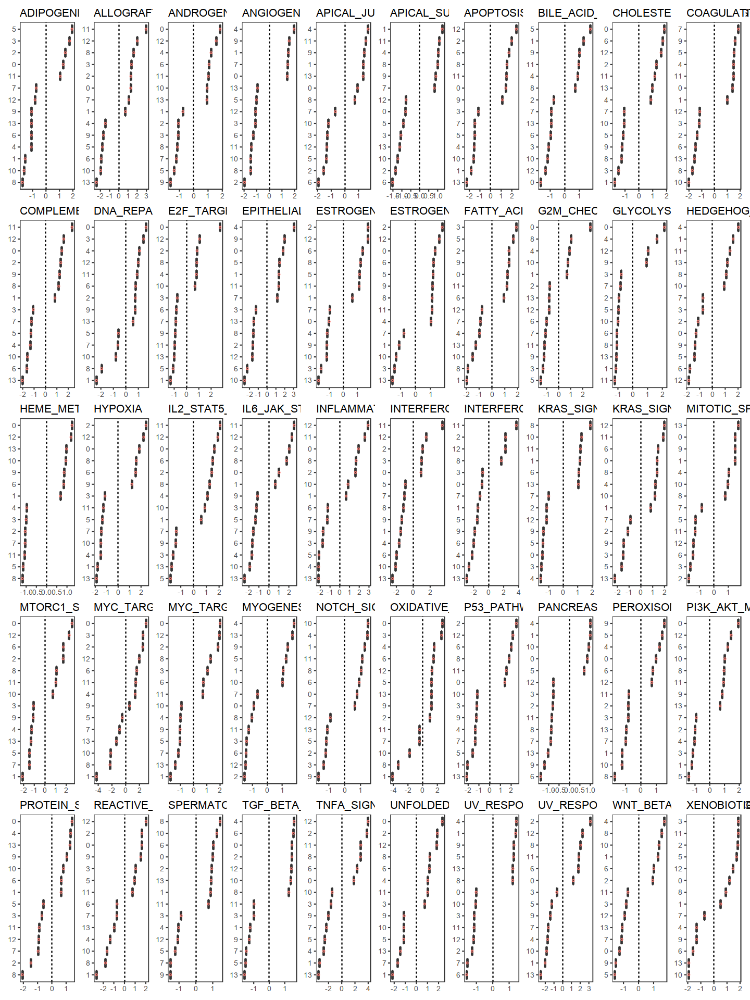

In [19]:
fig.size(16, 12)
obj$gsea %>% 
    subset(database %in% c('H')) %>% 
    dplyr::select(-leadingEdge) %>% 
    dplyr::mutate(SCORE = NES) %>% 
    dplyr::mutate(pathway = gsub('HALLMARK_', '', pathway)) %>% 
    split(.$pathway) %>% 
    imap(function(.SD, name) {
        ggplot(.SD, aes(reorder(Cluster, SCORE), SCORE)) + 
            geom_boxplot() + 
            geom_point(size = .5, shape = 21, aes(color = database)) + 
            theme_test(base_size = 10) + 
            geom_hline(yintercept = 0, linetype = 2) + 
            coord_flip() + 
            theme(axis.title = element_blank()) + 
            labs(title = name) + 
            guides(color = FALSE) +
            NULL
        
    }) %>% 
    purrr::reduce(`+`) + 
    plot_layout(nrow = 5)


## L1000

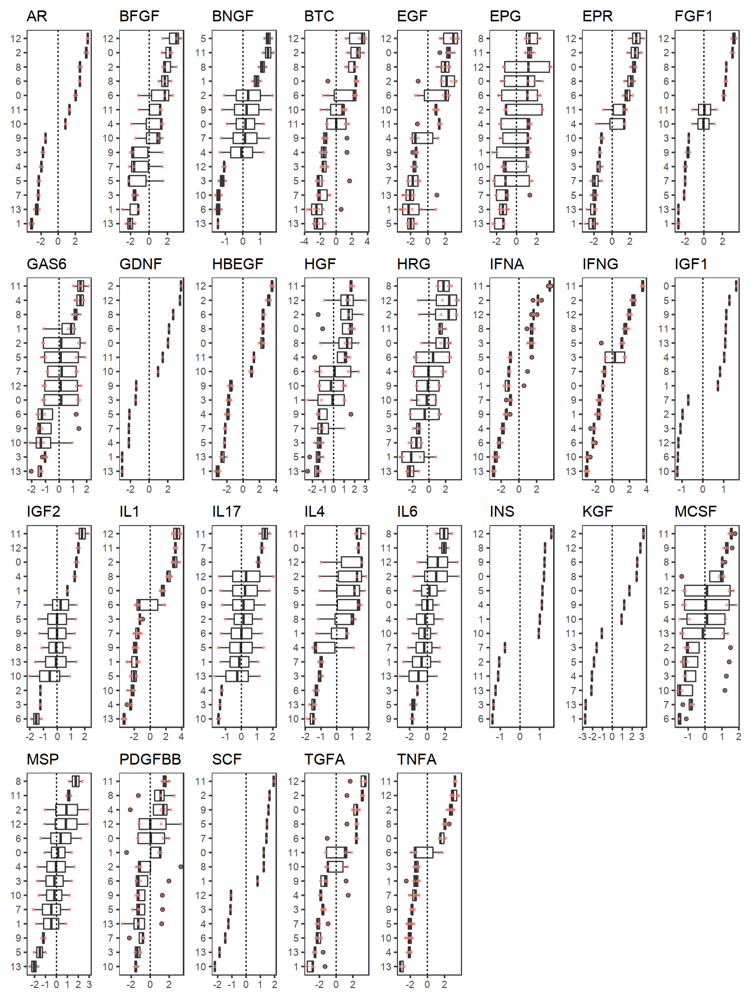

In [14]:
fig.size(16, 12)
obj$gsea %>% 
    subset(database %in% c('LINCS_L1000_Ligand_Perturbations_up')) %>% 
#     subset(database %in% c('LINCS_L1000_Ligand_Perturbations_up', 'LINCS_L1000_Ligand_Perturbations_down')) %>% 
    dplyr::select(-leadingEdge) %>% 
    tidyr::separate(pathway, c('Ligand', 'CellLine'), sep = '-') %>% 
    dplyr::mutate(SCORE = case_when(
        database == 'LINCS_L1000_Ligand_Perturbations_up' ~ NES,
        database == 'LINCS_L1000_Ligand_Perturbations_down' ~ -NES        
    )) %>% 
    split(.$Ligand) %>% 
    imap(function(.SD, name) {
        ggplot(.SD, aes(reorder(Cluster, SCORE), SCORE)) + 
            geom_boxplot() + 
            geom_point(size = .5, shape = 21, aes(color = database)) + 
            theme_test(base_size = 14) + 
            geom_hline(yintercept = 0, linetype = 2) + 
            coord_flip() + 
            theme(axis.title = element_blank()) + 
            labs(title = name) + 
            guides(color = FALSE) +
            NULL
        
    }) %>% 
    purrr::reduce(`+`) + 
    plot_layout(nrow = 4)


In [13]:
## only keep ligands tested in at least 3 cell lines
ligands_test <- obj$gsea %>% 
    subset(database %in% c('LINCS_L1000_Ligand_Perturbations_up')) %>% 
    tidyr::separate(pathway, c('Ligand', 'CellLine'), sep = '-') %>% 
    select(Ligand, CellLine) %>% unique() %>% 
    with(table(Ligand)) %>% 
    data.table() %>% 
    subset(N >= 3) %>% 
    with(Ligand)


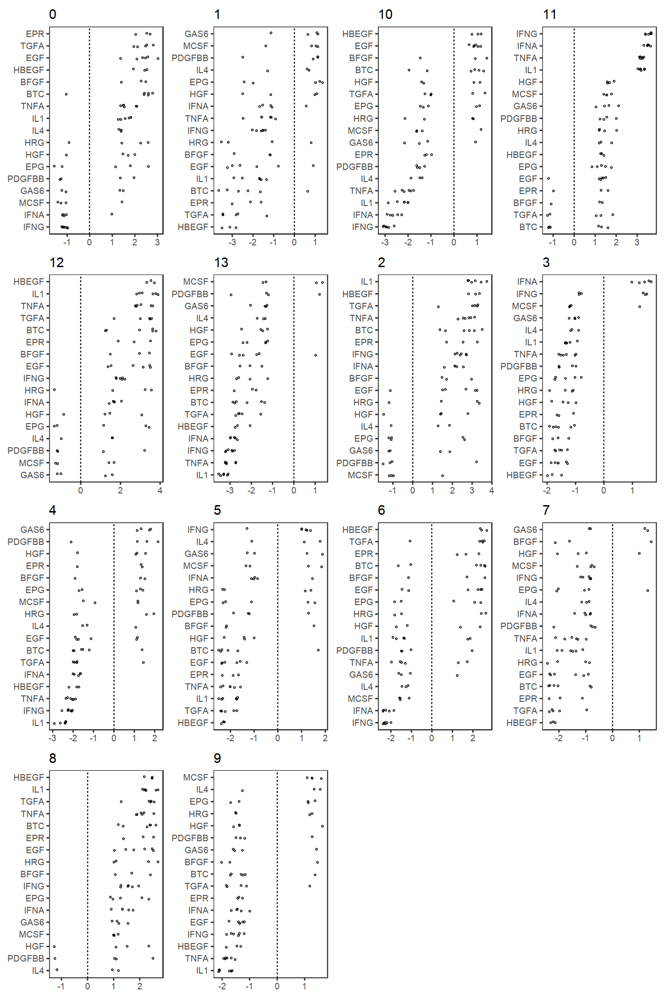

In [15]:
fig.size(18, 12)
obj$gsea %>% 
    subset(database %in% c('LINCS_L1000_Ligand_Perturbations_up')) %>% 
#     subset(database %in% c('LINCS_L1000_Ligand_Perturbations_up', 'LINCS_L1000_Ligand_Perturbations_down')) %>% 
    dplyr::select(-leadingEdge) %>% 
    tidyr::separate(pathway, c('Ligand', 'CellLine'), sep = '-') %>% 
    dplyr::mutate(SCORE = case_when(
        database == 'LINCS_L1000_Ligand_Perturbations_up' ~ NES,
        database == 'LINCS_L1000_Ligand_Perturbations_down' ~ -NES        
    )) %>% 
    subset(Ligand %in% ligands_test) %>% 
    dplyr::mutate(database = case_when(
        grepl('_up$', database) ~ 'UP',
        grepl('_down$', database) ~ 'DN'
    )) %>% 
    split(.$Cluster) %>% 
    imap(function(.SD, name) {
        ggplot(.SD, aes(reorder(Ligand, SCORE), SCORE)) + 
#             geom_boxplot() + 
            geom_jitter(size = .5, shape = 21, width = 0.1, height = 0) + 
#             geom_jitter(size = .5, shape = 21, aes(color = database), width = 0.1, height = 0) + 
            theme_test(base_size = 14) + 
            geom_hline(yintercept = 0, linetype = 2) + 
            coord_flip() + 
            theme(axis.title = element_blank()) + 
            labs(title = name) + 
#             guides(color = FALSE) +
            scale_color_tableau() + 
            NULL
        
    }) %>% 
    purrr::reduce(`+`) + 
    plot_layout(nrow = 4)


# Cache

In [70]:
saveRDS(obj, '/data/srlab2/ik936/Roche/data/cache/obj_fibroblasts.rds')

In [ ]:
# saveRDS(pb, '/data/srlab2/ik936/Roche/data/cache/pseudobulk_fibroblasts.rds')

In [ ]:
system.time({
    obj <- readRDS('/data/srlab2/ik936/Roche/data/cache/obj_fibroblasts.rds')
})

In [33]:
inflam_scores_df <- readRDS('/data/srlab2/ik936/Roche/data/cache/inflam_scores_icdf.rds')

obj$meta_data <- obj$meta_data %>% 
    dplyr::select(-matches('^Inflam|^percent_cd45')) %>%
    left_join(inflam_scores_df)


Joining, by = c("LibraryID", "Tissue")



More memory efficient: 

In [71]:
dname <- '/data/srlab2/ik936/Roche/data/cache/obj_fibroblasts/'
if (!dir.exists(dname)) dir.create(dname)

# obj %>% imap(function(.obj, .name) {
#     message(.name)
#     saveRDS(.obj, paste0(dname, .name, '.rds'))
#     return(.name)
# })


In [79]:
saveRDS(obj[['masc_meta']], paste0(dname, 'masc_meta', '.rds'))

# Extra analysis: unweighted PCA

## Unweighted PCA

In [13]:
t0 <- system.time({
    pca_res <- weighted_pca(obj$exprs_norm[obj$var_genes, ], rep(1, nrow(obj$meta_data)), npc=ncol(obj$V))    
})


In [15]:
## ~5 minutes
t0[['elapsed']] / 60

[1] 4.5964

In [16]:
obj$V_unweighed <- pca_res$embeddings

In [17]:
saveRDS(obj$V_unweighed, '/data/srlab2/ik936/Roche/data/cache/obj_fibroblasts/V_unweighted.rds')

## UMAP before

In [21]:
t1 <- system.time({
    U <- do_umap(obj$V)    
})


In [22]:
obj$umap_before <- U$embedding
obj$adj_before <- U$adj
obj$knn_before <- U$knnadj


In [23]:
saveRDS(obj$adj_before, '/data/srlab2/ik936/Roche/data/cache/obj_fibroblasts/adj_before.rds')
saveRDS(obj$knn_before, '/data/srlab2/ik936/Roche/data/cache/obj_fibroblasts/knn_before.rds')
saveRDS(obj$umap_before, '/data/srlab2/ik936/Roche/data/cache/obj_fibroblasts/umap_before.rds')
